# Pruebas de segmentación con el Catálogo Morfológico de Nebulosas Planetarias del IAC (NO SUPERVISADO)
En este documento vamos a probar las técnicas comentadas por Diego Cantorna en el documento de astrogestem (disponible en la carpeta astrosegstem de este mismo repositorio). Todas las técnicas testeadas en este Jupyter Notebook son de aprendizaje no supervisado.

## 0. Preparación del entorno
Para empezar, lo primero que vamos a hacer va a ser preparar el entorno en el que se van a hacer las ejecuciones, de donde el programa tiene que cargar las imágenes y las máscaras de las nebulosas planetarias y donde va a guardar los resultados obtenidos.

In [4]:
import os

print("Vamos a cambiar el directorio de trabajo")

# Indicamos la ruta del directorio de trabajo
# route = "C:\\Users\\Lucan\\OneDrive - Universidade da Coruña\\Escritorio\\4_GCEID\\TFG\\test\\PNe_segmentation"
route = os.getcwd() + "/TFG/test/PNe_segmentation"
os.chdir(route)

current_directory = os.getcwd()
print("\nEl directorio actual es:", current_directory)

# Listamos el contenido del directorio
files = os.listdir(current_directory)
print("\nContenido del directorio actual:")
for file in files:
    print("\t",file)


Vamos a cambiar el directorio de trabajo

El directorio actual es: /mnt/netapp2/Home_FT2/home/ulc/co/ela/TFG/test/PNe_segmentation

Contenido del directorio actual:
	 commands.txt
	 data
	 data_files.csv
	 data_files_1c.csv
	 images
	 launch_jupyter.sh
	 masks
	 segmentation_no_supervisada.ipynb
	 segmentation_no_supervisada_2c.ipynb
	 segmentation_no_supervisada_pytorch.ipynb
	 segmentation_supervisada.ipynb
	 segmentation_no_supervisada_pytorch_15_06_24.pdf
	 segmentation_no_supervisada_pytorch_16_06_24.pdf


### 0.1. Carga de las imágenes junto a sus máscaras


Vamos a hacer una prueba de como cargaríamos una máscara y contorno junto con la imagen a la que pertenece. Pero antes vamos a realizar ciertas operaciones para tener almacenados y clasificados todos los archivos que tenemos disponibles.

In [15]:
# Listamos el contenido del directorio de las máscaras
# masks_directory = "C:\\Users\\Lucan\\OneDrive - Universidade da Coruña\\Escritorio\\4_GCEID\\TFG\\test\\PNe_segmentation\\masks"
masks_directory = os.getcwd() + "/masks"
masksFiles = os.listdir(masks_directory)
masks_files = [file for file in masksFiles if file.endswith(".png")]

# data_directory = "C:\\Users\\Lucan\\OneDrive - Universidade da Coruña\\Escritorio\\4_GCEID\\TFG\\test\\PNe_segmentation\\data"
data_directory = os.getcwd() + "/data"
dataFiles = os.listdir(data_directory)
data_files = [file for file in dataFiles if file.endswith(".fits")]

Creamos un diccionario en el que las claves sean el nombre identificador de la nebulosa y el valor sea una lista con las máscaras y contornos disponibles de esa nebulosa.

In [16]:
masks_dict = {}

for mask_file in masks_files:
    nebula_name = mask_file.split("_")[:-1]
    nebula_name = "_".join(nebula_name)
    if masks_dict.get(nebula_name) is None:
        masks_dict[nebula_name] = [mask_file]
    else: 
        masks_dict[nebula_name].append(mask_file)

masks_dict


{'A13': ['A13_contour.png'],
 'A14': ['A14_contour.png', 'A14_mask.png'],
 'A16': ['A16_contour.png'],
 'A18': ['A18_contour.png', 'A18_mask.png'],
 'A19': ['A19_contour.png', 'A19_mask.png'],
 'A24': ['A24_contour.png', 'A24_mask.png'],
 'A2': ['A2_contour.png', 'A2_mask.png'],
 'A30': ['A30_contour.png', 'A30_mask.png'],
 'A39': ['A39_contour.png', 'A39_mask.png'],
 'A3': ['A3_contour.png'],
 'A43': ['A43_contour.png', 'A43_mask.png'],
 'A46': ['A46_contour.png', 'A46_mask.png'],
 'A4': ['A4_contour.png'],
 'A50': ['A50_contour.png', 'A50_mask.png'],
 'A52': ['A52_contour.png', 'A52_mask.png'],
 'A54': ['A54_contour.png', 'A54_mask.png'],
 'A57': ['A57_contour.png', 'A57_mask.png'],
 'A58': ['A58_contour.png', 'A58_mask.png'],
 'A63': ['A63_contour.png', 'A63_mask.png'],
 'A68': ['A68_contour.png', 'A68_mask.png'],
 'A70': ['A70_contour.png', 'A70_mask.png'],
 'A71': ['A71_contour.png', 'A71_mask.png'],
 'A72': ['A72_contour.png', 'A72_mask.png'],
 'A73': ['A73_contour.png'],
 'A75':

Comprobamos que todas las máscaras/contornos disponibles se han asignado a una nebulosa

In [17]:
masks_dict_count = sum(len(files) for files in masks_dict.values())
masks_files_count = len(masks_files)

if masks_dict_count == masks_files_count:
    print("The number of files in masks_dict is the same as the number of files in masks_files.")
else:
    print("The number of files in masks_dict is different from the number of files in masks_files.")
    
    files_not_in_data_dict = set(masks_files) - set(sum(masks_dict.values(), []))
    print("Files not in data_dict:", files_not_in_data_dict)


The number of files in masks_dict is the same as the number of files in masks_files.


Ahora creamos un diccionario similar al anterior, con las mismas claves, pero en los valores se van a guardar los archivos fits que se refieren a la nebulosa indicada.

In [18]:
import re
data_dict = {}

for nebula in masks_dict.keys():
    patron = re.compile(r'(?i)' + nebula + r'\D+.*')
    data_dict[nebula] = [file for file in data_files if patron.match(file)]

data_dict

{'A13': ['A13hcg.fits', 'A13o3cg.fits'],
 'A14': ['A14hac.fits',
  'A14hacee.fits',
  'A14hc.fits',
  'A14n2c.fits',
  'A14n2cee.fits',
  'A14ocg.fits'],
 'A16': ['A16_Hacc.fits', 'A16_occ.fits'],
 'A18': ['A18hc.fits', 'A18ogc.fits'],
 'A19': ['A19hg.fits', 'A19ocg.fits'],
 'A24': ['A24hgc.fits', 'A24ocg.fits'],
 'A2': ['A2hc.fits', 'A2oc.fits'],
 'A30': ['A30hc.fits', 'A30oc.fits'],
 'A39': ['A39hgc.fits', 'A39ocgc.fits', 'A39ocgce.fits'],
 'A3': ['A3hcg.fits', 'A3o3cg.fits'],
 'A43': ['A43hg.fits', 'A43og.fits'],
 'A46': ['A46hgc.fits', 'A46ogc.fits'],
 'A4': ['A4hc.fits', 'A4oc.fits'],
 'A50': ['A50h.fits', 'A50oc.fits'],
 'A52': ['A52hac.fits', 'A52o3c.fits'],
 'A54': ['A54hacg.fits', 'A54o3gc.fits'],
 'A57': ['A57Ha.fits',
  'A57Hac.fits',
  'A57Hace.fits',
  'A57o3.fits',
  'A57o3c.fits',
  'A57o3ce.fits'],
 'A58': ['A58blue.fits', 'A58hace.fits', 'A58n2ce.fits'],
 'A63': ['A63hac.fits', 'A63o3_badcg.fits'],
 'A68': ['A68hac.fits', 'A68o3c.fits'],
 'A70': ['A70hc.fits', 'A70oc.f

Comprobamos que todos los archivos fits disponibles se han asignado a una nebulosa

In [19]:
data_dict_count = sum(len(files) for files in data_dict.values())
data_files_count = len(data_files)

if data_dict_count == data_files_count:
    print("The number of files in data_dict is the same as the number of files in data_files.")
else:
    print("The number of files in data_dict is different from the number of files in data_files.")
    
    files_not_in_data_dict = set(data_files) - set(sum(data_dict.values(), []))
    print("Files not in data_dict:", files_not_in_data_dict)


The number of files in data_dict is the same as the number of files in data_files.


En este punto tenemos dos diccionarios con los cuales cargar los archivos facilmente y clasificados por el nombre identificador de la nebulosa.
Ahora sí, vamos a cargar todos los canales disponibles de una nebulosa junto a su contorno y máscara (si tiene).

In [50]:
from astropy.io import fits
import imageio as io
import numpy as np
def cargar_canales_nebulosa(nebula, data_dict, masks_dict, data_directory, masks_directory, name_files:bool=False):
    data_files = data_dict[nebula]
    masks_files = masks_dict[nebula]
    data = {}
    masks = {}
    charge_files = {}
    
    for file in masks_files:
        key = file.split("_")[-1].split(".")[0]
        image = io.imread("masks/"+file)
        if len(image.shape) > 2:
            image = image[:,:,0]
        masks[key] = image
        
    for file in data_files:
        image = fits.getdata("data/"+file)
        image = np.flip(image, axis=0)
        if image.shape == masks['contour'].shape:
            key = file.replace(nebula, "").replace("_","")[0].lower()
            data[key] = image
            charge_files[key] = file
        # else:
        #     print(f"Error: {file} has a different shape than the masks.")
    if not name_files:
        return data, masks
    else:
        return data, masks, charge_files

En este punto, ya podríamos cargar todos los canales y máscaras que tenemos, pudiendo distinguir por nebulosa. Por ejemplo, en la siguiente celda de código vamos a cargar todos los canales de una nebulosa en específico junto a sus máscaras.

In [35]:
data_dict['K2_1']

['K2_1hacg.fits', 'K2_1o3cg.fits']

In [29]:
canales, mascaras = cargar_canales_nebulosa("K3_46", data_dict, masks_dict, data_directory, masks_directory)

/scratch/7685103/ipykernel_3990083/1222435462.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = io.imread("masks/"+file)


Vamos a analizar como son las imagenes obtenidas, sus valores mínimos y máximos, sus dimensiones, etc.

In [30]:
def imprimir_info_imagen(image, title):
    min_value = np.min(image)
    max_value = np.max(image)
    dimensions = image.shape
    null_values = np.isnan(image).sum()
    print(title)
    print(f"Minimum value: {min_value}")
    print(f"Maximum value: {max_value}")
    print(f"Null values: {null_values}")
    print(f"Dimensions: {dimensions}\n")

In [31]:
# Analyze canales' images
for key, channel in canales.items():
    imprimir_info_imagen(channel, f"Channel {key}:")

# Analyze mascaras' images
for key, mask in mascaras.items():
    imprimir_info_imagen(mask, f"Mask {key}:")

Channel h:
Minimum value: 68.94923400878906
Maximum value: 22819.86328125
Null values: 0
Dimensions: (490, 490)

Channel o:
Minimum value: 3.305936098098755
Maximum value: 5316.0400390625
Null values: 0
Dimensions: (490, 490)

Mask contour:
Minimum value: 1
Maximum value: 255
Null values: 0
Dimensions: (490, 490)



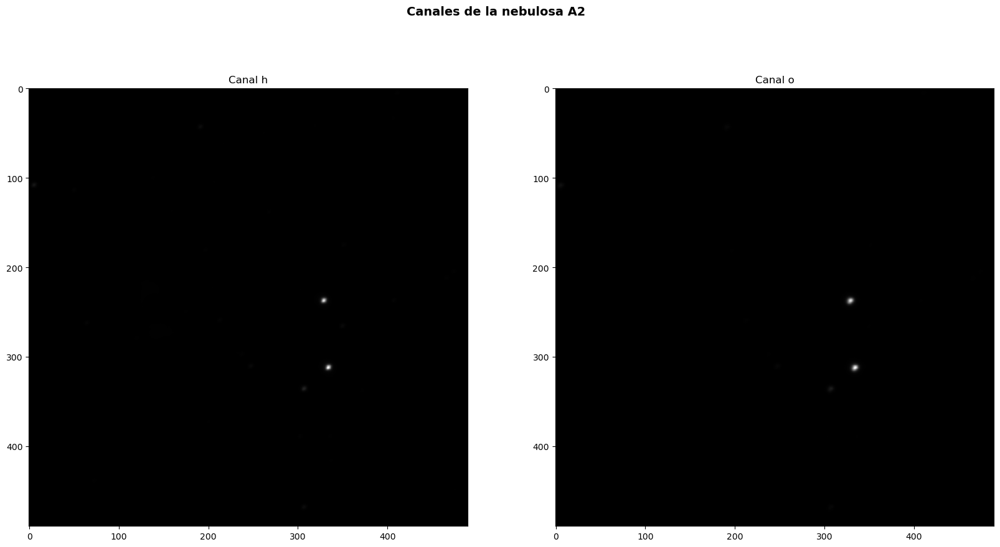

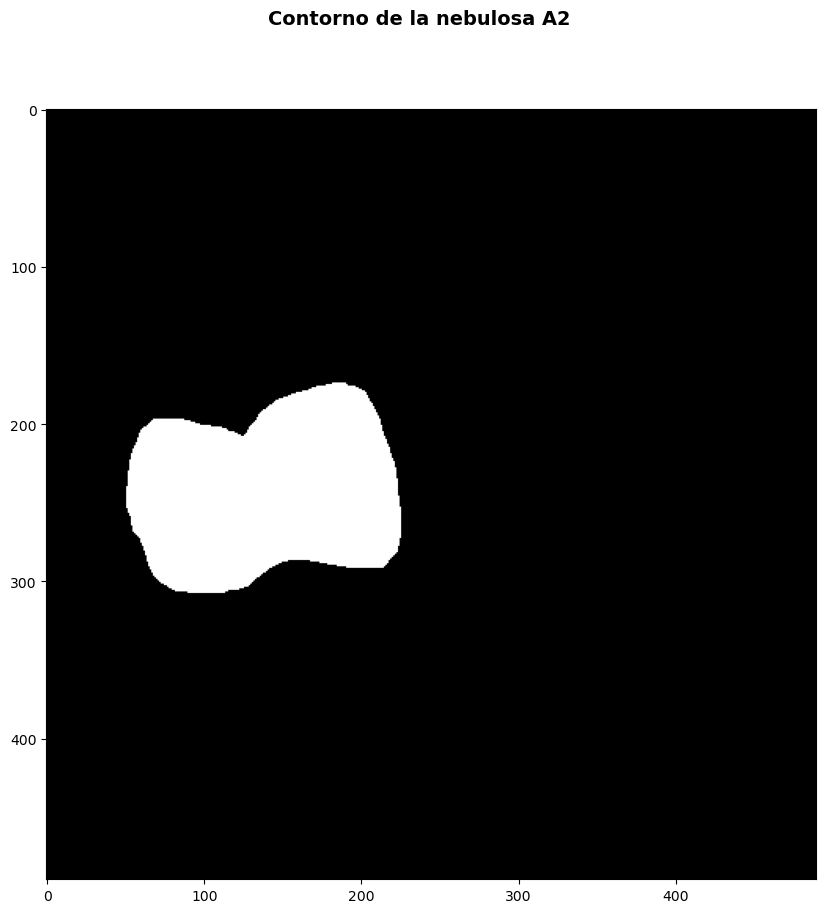

In [32]:
import matplotlib.pyplot as plt
num_images = len(canales)

fig, ax = plt.subplots(1, num_images, figsize=(10*num_images, 10))
fig.suptitle(f"Canales de la nebulosa A2", fontweight = 'bold', fontsize = 14)

for i, (key, channel) in enumerate(canales.items()):
    ax[i].imshow(channel, cmap = "gray")
    ax[i].set_title(f"Canal {key}")
fig.show()

if 'mask' in mascaras.keys():
    fig, ax = plt.subplots(1, 2, figsize=(20, 10))
    fig.suptitle(f"Contorno y máscara de la nebulosa A2", fontweight = 'bold', fontsize = 14)

    ax[0].imshow(mascaras['contour'], cmap = "gray")
    ax[1].imshow(mascaras['mask'], cmap = "gray")
    fig.show()
else:
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    fig.suptitle(f"Contorno de la nebulosa A2", fontweight = 'bold', fontsize = 14)

    ax.imshow(mascaras['contour'], cmap = "gray")
    fig.show()

### 0.2. Preprocesado de los datos

Como parte del preprocesado inicial, vamos a hacer un estudio de cuales son los canales/filtros que comparten todas (o la mayoría de nebulosas) para así empezar a hacer pruebas con un conjunto de imágenes lo más homogéneo posible (para los canales).

In [51]:
for i in data_dict.keys():
    canales, mascaras = cargar_canales_nebulosa(i, data_dict, masks_dict, data_directory, masks_directory)
    if len(canales) != 2:
        print(i, len(canales))
    

/scratch/7685103/ipykernel_3990083/1148693601.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = io.imread("masks/"+file)


A58 3
A71 1
He1_1 3
He1_2 3
He1_3 3
He2_428 3
He2_429 3
He2_430 3
He2_432 3
He2_437 3
He2_447 3
He2_459 3
h2 1
Hu1_1 3
IC4593 3
K3_1 3
K3_2 3
K3_5 3
K3_7 3
K3_16 3
K3_18 3
K3_21 3
K3_24 3
K3_26 3
K3_36 3
K3_38 3
K3_45 3
K3_3 3


En este punto se han eliminado algunas imágenes de nebulosas del conjunto de datos:
- A33: dimensiones descuadradas
- H3_75: dimensiones descuadradas 

Vamos a comprobar que las nebulosas tengan mínimo un canal en común y ver cual es:

In [56]:
cnt = {}
for i in data_dict.keys():
    canales, mascaras = cargar_canales_nebulosa(i, data_dict, masks_dict, data_directory, masks_directory)
    for key in canales.keys():
        if key in cnt.keys():
            cnt[key] += 1
        else:
            cnt[key] = 1
        
        if key == '.':
            print(i, key, canales.keys())

print(cnt)
    
    

/scratch/7685103/ipykernel_3990083/1148693601.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = io.imread("masks/"+file)


{'h': 89, 'o': 85, 'b': 1, 'n': 28}


Descartamos la nebulosa h2 debido a que no se no sabemos a que canal pertenece (creo que es una combinación en escala de grises de diferentes canales por como se describe en el .fits)

In [55]:
data_dict.pop('h2', None)

['h2.fits']

Como se puede observar, la mayoría de nebulosas tienen el canal 'h', por lo que nos vamos a quedar con todas las imágenes que contiene ese canal y vamos a empezar a trabajar con ellos.

In [57]:
new_data_dict = {}
for i in data_dict.keys():
    canales, mascaras, charge_files = cargar_canales_nebulosa(i, data_dict, masks_dict, data_directory, masks_directory, True)
    if 'h' in canales.keys():
        if 'n' in canales.keys() or 'o' in canales.keys() or 'b' in canales.keys():
            charge_files.pop('n', None)
            charge_files.pop('o', None)
            charge_files.pop('b', None)
        new_data_dict[i] = charge_files

print(f"El tamaño de data_dict es {len(data_dict)} y el tamaño de new_data_dict es {len(new_data_dict)}")

/scratch/7685103/ipykernel_3990083/1148693601.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = io.imread("masks/"+file)


El tamaño de data_dict es 89 y el tamaño de new_data_dict es 89


Vamos a crear el diccionario definitivo con los archivos que vamos a cargar. Para esta prueba inicial, vamos a cargar como máscara única el archivo _mask si la nebulosa lo tiene y si no cargaremos el _contour.

In [58]:
for nebula, files in new_data_dict.items():
    mask = [file for file in masks_dict[nebula] if 'contour' in file][0]
    if len(masks_dict[nebula]) > 1:
        mask = [file for file in masks_dict[nebula] if 'mask' in file][0]
    new_data_dict[nebula].update({'mask': mask})
# Mostramos un ejemplo para ver que todo ha ido correctamente
print(new_data_dict[nebula])

{'h': 'K3_3hace.fits', 'mask': 'K3_3_contour.png'}


Vamos a transformarlo a un dataframe de pandas para poder exportarlo a .csv y más adelante no tener que volver a hacer todo el procedimiento, además trabajar con dataframes de pandas puede ser mucho más accesible y fácil de visualizar.

In [59]:
import pandas as pd
df = pd.DataFrame.from_dict(new_data_dict, orient='index')

# Quiero cargar el nombre de la nebulosa como una columna y cambiarle el nombre de index a name
df.reset_index(inplace=True)
df.rename(columns={'index':'name'}, inplace=True)
print(df.head())

# Guardar el dataframe en un archivo csv
df.to_csv("data_files_1c.csv", index=False)

  name              h             mask
0  A13    A13hcg.fits  A13_contour.png
1  A14     A14hc.fits     A14_mask.png
2  A16  A16_Hacc.fits  A16_contour.png
3  A18     A18hc.fits     A18_mask.png
4  A19     A19hg.fits     A19_mask.png


Llegados a este punto, a no ser que se amplie el dataset de imágenes, no vamos a tener que volver a ejecutar esta parte inicial.

## 1. Carga del Dataset
Vamos a definir una clase, que tome como base la clase Sequence de Tensorflow, para poder cargar todo nuestro conjunto de imágenes de 2 canales con su máscara correspondiente.

In [1]:
import os

print("Vamos a cambiar el directorio de trabajo")

# Indicamos la ruta del directorio de trabajo
route = "C:\\Users\\Lucan\\OneDrive - Universidade da Coruña\\Escritorio\\4_GCEID\\TFG\\test\\PNe_segmentation"
route = os.getcwd()+ "/TFG/PNe_segmentation"
os.chdir(route)

current_directory = os.getcwd()
print("\nEl directorio actual es:", current_directory)

# Listamos el contenido del directorio
files = os.listdir(current_directory)
print("\nContenido del directorio actual:")
for file in files:
    print("\t",file)
    
# Listamos el contenido del directorio de las máscaras
# masks_directory = route+"TFG\\test\\PNe_segmentation\\masks"
# data_directory = route+"TFG\\test\\PNe_segmentation\\data"
## Ejecución en el CESGA Finisterrae III
masks_directory = route+"/masks"
data_directory = route+"/data"


Vamos a cambiar el directorio de trabajo

El directorio actual es: /mnt/netapp2/Home_FT2/home/ulc/cursos/cursob82/TFG/PNe_segmentation

Contenido del directorio actual:
	 data
	 images
	 masks
	 data_files.csv
	 data_files_1c.csv
	 commands.txt
	 tf_fits
	 skfuzzy
	 segmentation_supervisada.ipynb
	 launch_jupyter.sh
	 commands_AIDA.txt
	 segmentation_no_supervisada.ipynb
	 segmentation_no_supervisada_2c.ipynb
	 telegram_bot.py
	 train_py
	 train_sh


In [2]:
import tensorflow as tf
from tf_fits.image import image_decode_fits as decode_fits
import matplotlib.pyplot as plt
import random as rd
import numpy as np
import os

class NebulaeDataset(tf.keras.utils.Sequence):
    """
    Clase para cargar un conjunto de datos de nebulosas.
    
    Parámetros:
    image_path (str): Ruta al directorio de imágenes.
    mask_path (str): Ruta al directorio de máscaras.
    dataframe (pd.DataFrame): DataFrame que contiene los nombres de las imágenes y máscaras.
    x_transform (callable, opcional): Transformación a aplicar a las imágenes. Por defecto, normaliza las imágenes.
    x_transform_parameters (dict, opcional): Parámetros para la transformación de las imágenes.
    y_transform (callable, opcional): Transformación a aplicar a las máscaras. Por defecto, normaliza las máscaras y las convierte a enteros.
    y_transform_parameters (dict, opcional): Parámetros para la transformación de las máscaras.
    batch_size (int, opcional): Tamaño del lote. Por defecto es 1.
    max_normalize (int, opcional): Valor máximo para la normalización. Por defecto es 1.
    """
    def __init__(self, image_path, mask_path, dataframe, x_transform=None, x_transform_parameters={}, y_transform=None, y_transform_parameters={}, batch_size=1, max_normalize = 1):
        super(NebulaeDataset, self).__init__()
        
        self.image_path = image_path  # Ruta a las imágenes
        self.mask_path = mask_path  # Ruta a las máscaras
        
        self.batch_size = batch_size  # Tamaño del lote
        
        # Cargar los nombres de las imágenes y máscaras desde el dataframe
        self.data_dict = dataframe.set_index('name').to_dict(orient='index')

        # Filtrar las rutas de archivo según los nombres en el dataframe
        self.img_files = [os.path.join(self.image_path, files['h']) for files in self.data_dict.values()]
        self.mask_files = [os.path.join(self.mask_path, files['mask']) for files in self.data_dict.values()]
        self.names = list(self.data_dict.keys())  # Nombres de las imágenes y máscaras
        
        # Definir las transformaciones para las imágenes y máscaras
        if x_transform:
            self.x_transform = x_transform
        else:
            self.x_transform = lambda x: (tf.convert_to_tensor(x) - np.min(x)) / (np.max(x) - np.min(x)) * max_normalize

        if y_transform:
            self.y_transform = y_transform
        else:
            self.y_transform = lambda y: (tf.cast((tf.convert_to_tensor(y) - np.min(y)) / (np.max(y) - np.min(y)), dtype=tf.int8))
        
        self.x_transform_parameters = x_transform_parameters  # Parámetros para la transformación de las imágenes
        self.y_transform_parameters = y_transform_parameters  # Parámetros para la transformación de las máscaras
        
    def __getitem__(self, index):
        """
        Devuelve un lote de imágenes y máscaras.
        
        Parámetros:
        index (int): Índice del lote.
        
        Devuelve:
        batch_x (list): Lote de imágenes.
        batch_y (list): Lote de máscaras.
        batch_names (list): Nombres de las imágenes y máscaras en el lote.
        """
        img_paths = self.img_files[index*self.batch_size:(index+1)*self.batch_size]
        mask_paths = self.mask_files[index*self.batch_size:(index+1)*self.batch_size]
        names = self.names[index*self.batch_size:(index+1)*self.batch_size]
        
        batch_x = []
        batch_y = []
        batch_names = []
        for x_path, y_path, name in zip(img_paths, mask_paths, names):
            image = []
            # Cargar la imagen y la máscara
            channel = tf.io.read_file(x_path)
            channel = decode_fits(channel, header=0)
            channel = np.flip(channel, axis=0)
            channel = self.x_transform(tf.expand_dims(channel, axis=-1), **self.x_transform_parameters) # Necesito añadir una dimensión extra para que las imágenes sean de 3D
            image.append(channel)
        
            mask = tf.io.read_file(y_path)
            mask = tf.image.decode_png(mask, channels=1)
            mask = self.y_transform(mask, **self.y_transform_parameters)
            
            batch_x.append(tf.concat(image, axis=-1))
            batch_y.append(mask)
            batch_names.append(name)
            
        return batch_x, batch_y, batch_names

    def __len__(self):
        """
        Devuelve el número de lotes en el conjunto de datos.
        
        Devuelve:
        int: Número de lotes.
        """
        return len(self.img_files) // self.batch_size

    def random_plot(self, index, plot_image = True, plot_mask = False):
        """
        Muestra una imagen y/o máscara aleatoria del lote.
        
        Parámetros:
        index (int): Índice del lote.
        plot_image (bool, opcional): Si es True, muestra la imagen. Por defecto es True.
        plot_mask (bool, opcional): Si es True, muestra la máscara. Por defecto es False.
        """
        image, mask, name = self[index]
        rnd_choice = rd.choice(range(self.batch_size))
        if plot_image:
            fig, ax = plt.subplots(1, 1, figsize=(5, 5))
            fig.suptitle(f"Canales de la nebulosa {name[rnd_choice]}", fontweight = 'bold', fontsize = 14)
            ax.imshow(image[rnd_choice][:,:,0], cmap = "gray")
            ax.set_title(f"Canal H")
            fig.show()
        if plot_mask:
            fig, ax = plt.subplots(1, 1, figsize=(5, 5))
            fig.suptitle(f"Máscara de la nebulosa {name[rnd_choice]}", fontweight = 'bold', fontsize = 14)
            ax.imshow(mask[rnd_choice][:,:,0], cmap = "gray")
            fig.show()



Ahora deberíamos de ser capaces de poder cargar todas las imágenes, como tensores de TensorFlow, de nuestro csv como un Dataset

In [3]:
import pandas as pd
df = pd.read_csv("data_files_1c.csv")
dataset = NebulaeDataset(data_directory, masks_directory, df)

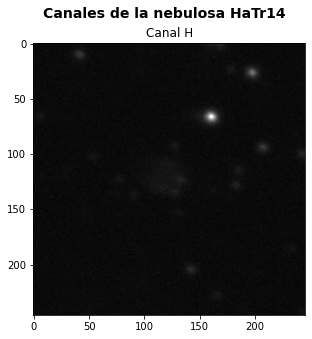

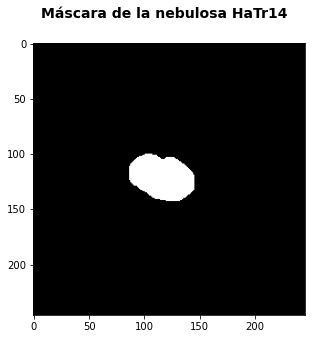

In [4]:
dataset.random_plot(42, plot_image = True, plot_mask = True)

## 2. Segmentación de las imágenes
Para la segmentación de las imágenes, vamos a probar diferentes algoritmos/técnicas propuestas por Diego Cantorna en el notebook de 'astrosegstem', pero para un mayor conjunto de datos para poder evaluarlas y verificar sus resultados.

### 2.0. Evaluación de resultados
Para evaluar el resultado de las técnicas de segmentación se pueden emplear distintas métricas.

Algunas de las métricas más utilizadas son la precisión, accuracy y recall, que junto al análisis de la matriz de confusión son las más utilizadas para cualquier problema de procesamiento de imágenes. A estas también se unen:
- **Coeficiente de Dice** (Dice Similarity Coefficient): Mide la similitud entre la segmentación predicha y la segmentación de referencia. Valores más cercanos a 1 indican una mejor superposición.
- **Índice de Jaccard** (Jaccard Index o Intersection over Union, IoU): Calcula la intersección entre la segmentación predicha y la segmentación de referencia dividida por su unión. También mide la superposición.
las cuales son métricas básicas y esenciales en los problemas de segmentación.

Vamos a utilizar todas estas métricas para evaluar nuestras técnicas de segmentación.

In [5]:
from sklearn import metrics
def dice_coef(y_true, y_pred, smooth=1):
    intersection = np.sum(y_true * y_pred)
    union = np.sum(y_true) + np.sum(y_pred)
    dice = (2. * intersection + smooth) / (union + smooth)
    return dice

def evaluate_segmentation(mask, segmentation, confusion_matrix=False, verbose=False):
    mask = tf.reshape(mask, -1)
    segmentation = segmentation.ravel()
    # Calcular el índice de Jaccard
    jaccard = metrics.jaccard_score(mask, segmentation)
    # Calcular el índice de DICE
    dice = dice_coef(mask, segmentation)
    # Calcular el índice de precisión
    precision = metrics.precision_score(mask, segmentation)
    # Calcular el índice de sensibilidad
    recall = metrics.recall_score(mask, segmentation)
    # Calcular el accuracy
    accuracy = metrics.accuracy_score(mask, segmentation)

    conf_matrix = None
    
    if verbose:
        # Imprimir los resultados	
        print(f"Jaccard: {jaccard:.4f}\tDICE: {dice:.4f}\tPrecisión: {precision:.4f}\tSensibilidad: {recall:.4f}\n")
    
    if confusion_matrix:
        # Calcular la matriz de confusión
        conf_matrix = metrics.confusion_matrix(mask, segmentation)
        if verbose:
            print(' Verdaderos negativos (TN):', conf_matrix[0, 0])

            print(' Falsos positivos (FP):', conf_matrix[0, 1])

            print(' Falsos negativos (FN):', conf_matrix[1, 0])

            print(' Verdaderos positivos (TP):', conf_matrix[1, 1])
            print('\n')

        return jaccard, dice, accuracy, precision, recall, conf_matrix
    
    return jaccard, dice, accuracy, precision, recall, conf_matrix

### 2.1. Técnicas de agrupamiento de datos
Las técnicas de agrupamiento (clustering) tratan de encontrar una partición de un
conjunto de datos de forma que los elementos de un mismo grupo sean más similares
que los elementos de grupos distintos. Esto permite resumir un conjunto de datos,
y puede facilitar algunos procesos de visualización o análisis posteriores con otras
técnicas.

### 2.1. K-Means
Vamos a comenzar por la técnica más básica (y en la que se basan la mayoría), K-Means.

Para aplicar el algoritmo se selecciona el número de grupos a utilizar y un prototipo (elemento representativo) de cada grupo. A continuación se realiza un proceso iterativo en el que se van asignando datos al grupo más próximo, se recalcula el prototipo de cada grupo, y se repite el proceso hasta que se estabiliza. 

En este caso aplicaremos el algoritmo a los píxeles de imágenes de niveles de gris, por lo que el prototipo de cada grupo será el valor de un píxel. El número de grupos podemos establecerlo manualmente, realizando pruebas con distintos valores. Existen algoritmos más complejos que tratan de automatizar el proceso, pero es interesante familiarizarse inicialmente con las versiones más simples de los algoritmos, para centrar el estudio en los aspectos fundamentales.


Las pruebas con el K-Means van a ser realizadas con un modelo K-Means para cada imagen (para ambos canales) normalizando los datos entre 0 y 1 y dejandolos con sus valores reales.

In [6]:
from sklearn.cluster import KMeans
import cv2
import itertools

def generate_segmentations(im_segm, indices_grupos, plot=False, rango=(-1, 2)):
    indice_nuevo = max(indices_grupos) + 1
    for indice_original in indices_grupos:
        im_segm[im_segm == indice_original] = indice_nuevo
        indice_nuevo += 1 
    
    median = np.median(indices_grupos+max(indices_grupos)).astype(int)
    
    # Generar las imágenes segmentadas
    segmentaciones = []
    for i in range(rango[0], rango[1]):
        im_segm_binaria = (im_segm == median + i).astype(int)
        segmentaciones.append(im_segm_binaria)
        
    # Generar todas las combinaciones de las imágenes segmentadas
    combinaciones = []
    for L in range(1, len(segmentaciones)+1):
        for subset in itertools.combinations(segmentaciones, L):
            combinacion = sum(subset)
            combinaciones.append(combinacion)
    
    # Si plot es True, mostrar todas las combinaciones
    if plot:
        for i, combinacion in enumerate(combinaciones):
            plt.figure()
            plt.imshow(combinacion[:,:,0], cmap='gray')
            plt.title(f'Combinación {i+1}')
        plt.show()
    
    return combinaciones

def calcular_atributos(imagen):
    # Convertir la imagen a escala de grises de 8 bits
    imagen = imagen.astype(np.uint8)
    
    # Encontrar los componentes conectados en la imagen
    num_etiquetas, etiquetas = cv2.connectedComponents(imagen)

    # Contar el número de píxeles en cada componente
    num_pixeles_por_componente = np.bincount(etiquetas.flatten())
    
    num_componentes_pequenos = np.sum(num_pixeles_por_componente < 0.05 * imagen.shape[0] * imagen.shape[1])
    
    # Encontrar los contornos del objeto
    contornos, _ = cv2.findContours(imagen, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Para cada objeto en la imagen, calcular el área y el perímetro
    compactaciones = []
    areas = []
    for contorno in contornos:
        area = cv2.contourArea(contorno)
        perimetro = cv2.arcLength(contorno, True)
        
        # Evitar la división por cero
        if area == 0:
            continue
        
        # Calcular la compactación como (perímetro al cuadrado) / área
        compactacion = (perimetro**2) / area 
        compactaciones.append(compactacion)
        areas.append(area)
        
    # Comprobar si compactaciones y areas están vacías antes de calcular la media y el máximo
    if compactaciones:
        media_compactaciones = np.mean(compactaciones)
    else:
        media_compactaciones = np.nan

    if areas:
        max_area = np.max(areas)
        sum_area = np.sum(areas)
    else:
        max_area = np.nan
        sum_area = np.nan

    # Devolver la compactación media de todos los objetos en la imagen
    return media_compactaciones, len(compactaciones), max_area, sum_area, num_componentes_pequenos

def apply_KMeans(im, mask, name, plot=False, rango = None, **kwargs):
    """
    Aplica el algoritmo K-Means a una imagen para segmentarla.
    
    Parámetros:
    im (np.array): Imagen a segmentar.
    mask (np.array): Máscara de la imagen.
    name (str): Nombre de la imagen.
    plot (bool, opcional): Si es True, muestra la imagen segmentada y la máscara. Por defecto es False.
    **kwargs: Parámetros adicionales para el algoritmo K-Means.
    
    Devuelve:
    kmeans (KMeans): Modelo K-Means entrenado.
    im_segm_binaria (np.array): Imagen segmentada.
    """
    im_array = tf.reshape(im, (-1, 1))  # Redimensionar la imagen para el algoritmo K-Means
    
    kmeans = KMeans(**kwargs).fit(im_array)  # Entrenar el modelo K-Means
    
    # Obtener la imagen segmentada aplicando el algoritmo a cada píxel de la imagen
    im_segm_array = kmeans.predict(im_array)

    # Cambiar las dimensiones de los datos segmentados para que se correspondan con la imagen inicial
    im_segm = im_segm_array.reshape(im.shape[0], im.shape[1], 1)
    
    indices_grupos = np.argsort(kmeans.cluster_centers_.flatten())
    
    if kwargs.get("n_clusters") > 2:
        if rango == None:
            rango = (-1, 2)
            
        images_segmented = generate_segmentations(im_segm, indices_grupos, plot=True, rango = rango)
        
        # for i, img_seg in enumerate(images_segmented):
        #     indice_nuevo = max(indices_grupos) + 1
        #     for indice_original in indices_grupos:
        #         img_seg[img_seg == indice_original] = indice_nuevo
        #         indice_nuevo += 1 
        #     images_segmented[i] = (img_seg == np.max(img_seg)).astype(int)  # Convertir la imagen segmentada a binaria
            
        compactaciones = []
        num_objetos = []
        max_areas = []
        sum_areas = []
        num_componentes_peq = []
        for image in images_segmented:
            compactacion, num_obj, area_max, sum_area, num_comp_peq = calcular_atributos(image)
            compactaciones.append(compactacion)
            num_objetos.append(num_obj)
            max_areas.append(area_max)
            sum_areas.append(area_max)
            num_componentes_peq.append(num_comp_peq)
        
        media_compactaciones = np.median(compactaciones)
        media_areas = np.median(sum_areas)
        # Calcular la diferencia absoluta entre cada compactación y la media
        # diferencias = np.abs(np.array(compactaciones) - media_compactaciones)
        diferencias_comp = np.abs(np.array(compactaciones) - media_compactaciones)
        diferencias_areas = np.abs(np.array(sum_areas) - media_areas) / np.std(sum_areas)
        # Normalizar las diferencias y el número de objetos para que tengan la misma escala
        compactaciones_norm = (diferencias_comp - np.min(diferencias_comp)) / (np.max(diferencias_comp) - np.min(diferencias_comp))
        areas_norm = (diferencias_areas - np.min(diferencias_areas)) / (np.max(diferencias_areas) - np.min(diferencias_areas))
        # num_objetos_norm = (num_objetos - np.min(num_objetos)) / (np.max(num_objetos) - np.min(num_objetos))
        # num_componentes_peq_norm = (num_componentes_peq - np.min(num_componentes_peq)) / (np.max(num_componentes_peq) - np.min(num_componentes_peq))
        
        puntuaciones = compactaciones_norm + 1.5*areas_norm
        
        # Seleccionar la imagen con la compactación más cercana a la media
        im_segm_binaria = images_segmented[np.argmin(puntuaciones)]
    else:
        indice_nuevo = max(indices_grupos) + 1
        for indice_original in indices_grupos:
            im_segm[im_segm == indice_original] = indice_nuevo
            indice_nuevo += 1 
            
        im_segm_binaria = (im_segm == np.max(im_segm)).astype(int)  # Convertir la imagen segmentada a binaria
        
    if plot:
        # Visualizar la imagen segmentada y la máscara
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im_segm_binaria[:,:,0], cmap = 'gray')
        ax[0].set_title(f"Segmentación K-Means")
        ax[1].imshow(mask[:,:,0], cmap = "gray")
        ax[1].set_title(f"Máscara")
    
    return kmeans, im_segm_binaria

Probamos K-Means normalizando los datos entre 0 y 1 y sin normalizar.

/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


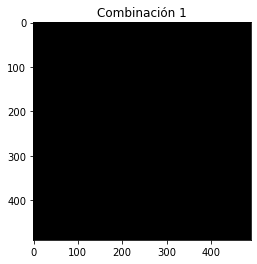

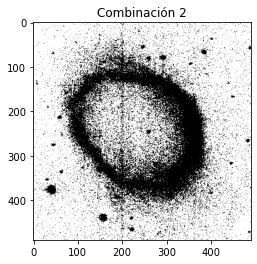

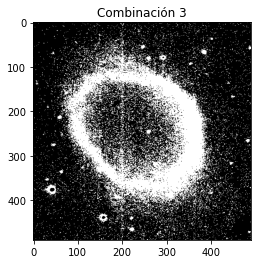

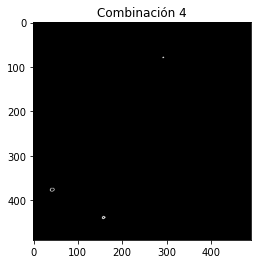

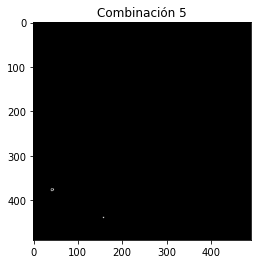

...

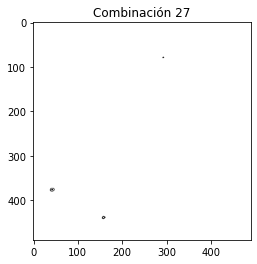

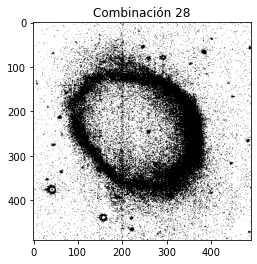

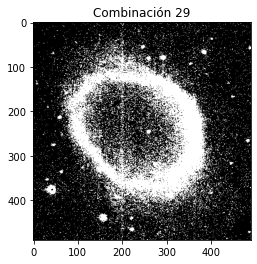

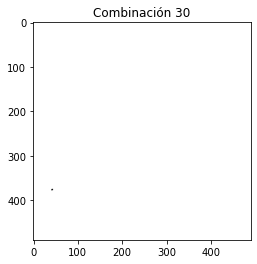

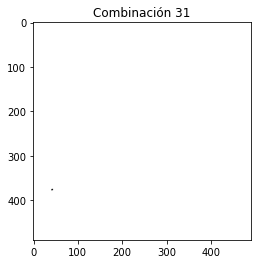

/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Jaccard: 0.0000
DICE: 0.0000
Accuracy: 0.7361807580174927
Precisión: 0.0000
Sensibilidad: 0.0000



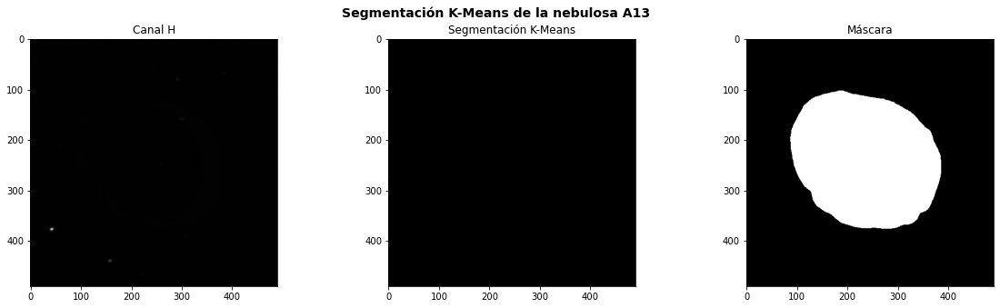

: 

In [13]:
# Prueba normalizando los datos entre 0 y 1
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1)  # Crea un conjunto de datos de nebulosas

# Inicializa un diccionario para almacenar los resultados de las métricas de evaluación
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = False  # Indica si se deben trazar las imágenes segmentadas
plot_pne_name = ["A18", "A43"]  # Nombres de las nebulosas a trazar

# Itera sobre el conjunto de datos
for im, mask, name in dataset:
    # Aplica el algoritmo K-Means a cada imagen
    kmeans, im_segm = apply_KMeans(im[0], mask[0], name[0], plot=plot, rango=(-2,3), n_clusters=5, max_iter=10, random_state=42)
    
    # Evalúa la segmentación y almacena los resultados
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)

    # Si el nombre de la nebulosa está en la lista de nombres a trazar y no se ha trazado ninguna imagen, traza la imagen segmentada y la máscara
    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"Canal H")
        ax[1].imshow(im_segm[:,:,0], cmap = "gray")
        ax[1].set_title(f"Segmentación K-Means")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Máscara")
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
    ax[0].imshow(im[0][:,:,0], cmap = "gray")
    ax[0].set_title(f"Canal H")
    ax[1].imshow(im_segm[:,:,0], cmap = "gray")
    ax[1].set_title(f"Segmentación K-Means")
    ax[2].imshow(mask[0][:,:,0], cmap = "gray")
    ax[2].set_title(f"Máscara")
    break

# Imprime las métricas de evaluación promedio
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")


Jaccard: 0.2255
DICE: 0.3089
Accuracy: 0.7935941314645348
Precisión: 0.4406
Sensibilidad: 0.3988



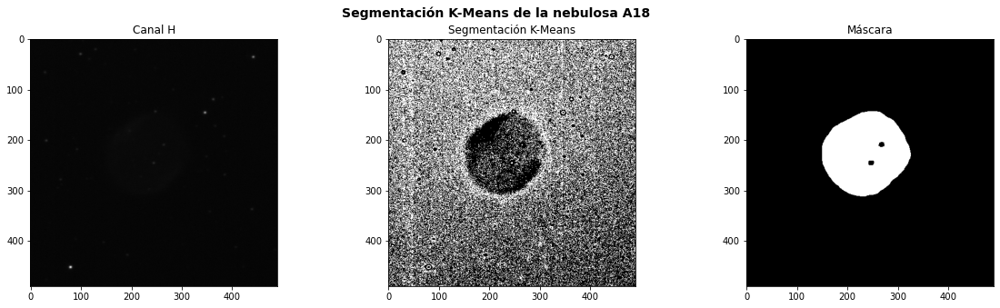

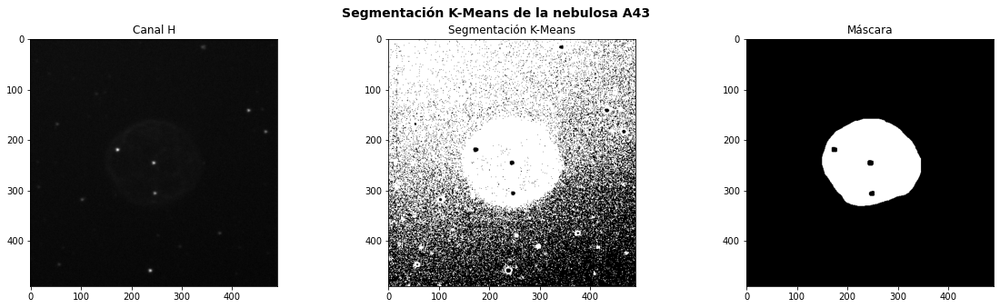

In [8]:
# Prueba sin normalizar los datos
transform = lambda x: tf.convert_to_tensor(x)

dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform = transform)

# Inicializa un diccionario para almacenar los resultados de las métricas de evaluación
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = False  # Indica si se deben trazar las imágenes segmentadas
plot_pne_name = ["A18", "A43"]  # Nombres de las nebulosas a trazar

# Itera sobre el conjunto de datos
for im, mask, name in dataset:
    # Aplica el algoritmo K-Means a cada imagen
    kmeans, im_segm = apply_KMeans(im[0], mask[0], name[0], plot=plot, rango=(0,3), n_clusters=5, max_iter=10, random_state=42)
    
    # Evalúa la segmentación y almacena los resultados
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)

    # Si el nombre de la nebulosa está en la lista de nombres a trazar y no se ha trazado ninguna imagen, traza la imagen segmentada y la máscara
    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"Canal H")
        ax[1].imshow(im_segm[:,:,0], cmap = "gray")
        ax[1].set_title(f"Segmentación K-Means")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Máscara")
        
# Imprime las métricas de evaluación promedio
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")


Podemos observar que el funcionamiento del K-Means es exactamente igual si normalizamos las imagenes que si las dejamos con sus valores originales

### 2.2. Fuzzy C-Means (FCM)
Este algoritmo está basado en el anterior algoritmo, K-Means, pero a diferencia de el, se consideran grados de pertenencia difusos (en vez de aportar valores binarios, aporta un nivel de pertencencia entre 0 y 1).


Probamos FCM normalizando los datos entre 0 y 1 y sin normalizar.

In [7]:
import skfuzzy as fuzz

def generate_segmentations(im_segm, indices_grupos, plot=False, rango=(-1, 2)):
    indice_nuevo = max(indices_grupos) + 1
    for indice_original in indices_grupos:
        im_segm[im_segm == indice_original] = indice_nuevo
        indice_nuevo += 1 
    
    median = np.median(indices_grupos+max(indices_grupos)).astype(int)
    
    # Generar las imágenes segmentadas
    segmentaciones = []
    for i in range(rango[0], rango[1]):
        im_segm_binaria = (im_segm == median + i).astype(int)
        segmentaciones.append(im_segm_binaria)
        
    # Generar todas las combinaciones de las imágenes segmentadas
    combinaciones = []
    for L in range(1, len(segmentaciones)+1):
        for subset in itertools.combinations(segmentaciones, L):
            combinacion = sum(subset)
            combinaciones.append(combinacion)
    
    # Si plot es True, mostrar todas las combinaciones
    if plot:
        for i, combinacion in enumerate(combinaciones):
            plt.figure()
            plt.imshow(combinacion[:,:,0], cmap='gray')
            plt.title(f'Combinación {i+1}')
        plt.show()
    
    return combinaciones

def calcular_atributos(imagen):
    # Convertir la imagen a escala de grises de 8 bits
    imagen = imagen.astype(np.uint8)
    
    # Encontrar los componentes conectados en la imagen
    num_etiquetas, etiquetas = cv2.connectedComponents(imagen)

    # Contar el número de píxeles en cada componente
    num_pixeles_por_componente = np.bincount(etiquetas.flatten())
    
    num_componentes_pequenos = np.sum(num_pixeles_por_componente < 0.05 * imagen.shape[0] * imagen.shape[1])
    
    # Encontrar los contornos del objeto
    contornos, _ = cv2.findContours(imagen, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Para cada objeto en la imagen, calcular el área y el perímetro
    compactaciones = []
    areas = []
    for contorno in contornos:
        area = cv2.contourArea(contorno)
        perimetro = cv2.arcLength(contorno, True)
        
        # Evitar la división por cero
        if area == 0:
            continue
        
        # Calcular la compactación como (perímetro al cuadrado) / área
        compactacion = (perimetro**2) / area 
        compactaciones.append(compactacion)
        areas.append(area)
        
    # Comprobar si compactaciones y areas están vacías antes de calcular la media y el máximo
    if compactaciones:
        media_compactaciones = np.mean(compactaciones)
    else:
        media_compactaciones = np.nan

    if areas:
        max_area = np.max(areas)
        sum_area = np.sum(areas)
    else:
        max_area = np.nan
        sum_area = np.nan

    # Devolver la compactación media de todos los objetos en la imagen
    return media_compactaciones, len(compactaciones), max_area, sum_area, num_componentes_pequenos

def apply_FCM(im, mask, name, plot=False, threshold = None, rango = None, **kwargs):
    """
    Aplica el algoritmo Fuzzy C-Means (FCM) a una imagen para segmentarla.
    
    Parámetros:
    im (np.array): Imagen a segmentar.
    mask (np.array): Máscara de la imagen.
    name (str): Nombre de la imagen.
    plot (bool, opcional): Si es True, muestra la imagen segmentada y la máscara. Por defecto es False.
    threshold (float, opcional): Umbral para la pertenencia al cluster. Si se especifica, los píxeles con una pertenencia menor al umbral se consideran como fondo.
    **kwargs: Parámetros adicionales para el algoritmo FCM.
    
    Devuelve:
    cntr (np.array): Centroides de los clusters.
    u (np.array): Matriz de pertenencia al cluster.
    u0 (np.array): Matriz de pertenencia inicial al cluster.
    d (np.array): Matriz de distancias al cluster.
    jm (float): Valor de la función objetivo.
    p (int): Número de iteraciones.
    fpc (float): Coeficiente de partición difusa.
    im_segm_binaria (np.array): Imagen segmentada.
    """
    # if isinstance(im, np.ndarray):
    #     im_array = im.reshape(-1, 2).T
    # else:
    #     im_array = im.numpy().reshape(-1, 2).T  # Redimensionar la imagen para el algoritmo FCM
    im_array = tf.reshape(im, (1, -1)).numpy()
    
    cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(data=im_array, **kwargs)  # Aplicar el algoritmo FCM
    
    # Asociar a cada píxel el cluster para el que tiene una mayor pertenencia
    clusters_array = np.argmax(u, axis=0)
    maximos = np.max(u, axis=0)
    
    # Cambiar las dimensiones de los datos segmentados para que se correspondan con la imagen inicial
    im_segm = clusters_array.reshape(im.shape[0], im.shape[1], 1)
    im_maxs = maximos.reshape(im.shape[0], im.shape[1], 1)
    
    indices_grupos = np.argsort(cntr.flatten())

    if kwargs.get("c") > 2:
        if rango == None:
            rango = (-1, 2)
            
        images_segmented = generate_segmentations(im_segm, indices_grupos, plot=False, rango = rango)
        
        compactaciones = []
        num_objetos = []
        max_areas = []
        sum_areas = []
        num_componentes_peq = []
        for image in images_segmented:
            compactacion, num_obj, area_max, sum_area, num_comp_peq = calcular_atributos(image)
            compactaciones.append(compactacion)
            num_objetos.append(num_obj)
            max_areas.append(area_max)
            sum_areas.append(area_max)
            num_componentes_peq.append(num_comp_peq)
        
        media_compactaciones = np.median(compactaciones)
        media_areas = np.median(sum_areas)
        # Calcular la diferencia absoluta entre cada compactación y la media
        # diferencias = np.abs(np.array(compactaciones) - media_compactaciones)
        diferencias_comp = np.abs(np.array(compactaciones) - media_compactaciones)
        diferencias_areas = np.abs(np.array(sum_areas) - media_areas) / np.std(sum_areas)
        # Normalizar las diferencias y el número de objetos para que tengan la misma escala
        compactaciones_norm = (diferencias_comp - np.min(diferencias_comp)) / (np.max(diferencias_comp) - np.min(diferencias_comp))
        areas_norm = (diferencias_areas - np.min(diferencias_areas)) / (np.max(diferencias_areas) - np.min(diferencias_areas))
        # num_objetos_norm = (num_objetos - np.min(num_objetos)) / (np.max(num_objetos) - np.min(num_objetos))
        # num_componentes_peq_norm = (num_componentes_peq - np.min(num_componentes_peq)) / (np.max(num_componentes_peq) - np.min(num_componentes_peq))
        
        puntuaciones = compactaciones_norm + 1.5*areas_norm
        
        # Seleccionar la imagen con la compactación más cercana a la media
        im_segm_binaria = images_segmented[np.argmin(puntuaciones)]
    else:
        indice_nuevo = max(indices_grupos) + 1
        for indice_original in indices_grupos:
            im_segm[im_segm == indice_original] = indice_nuevo
            indice_nuevo += 1 
        
        im_segm_binaria = (im_segm == np.max(im_segm)).astype(int)  # Convertir la imagen segmentada a binaria
    
    if threshold:
        im_segm_binaria = im_segm_binaria * (im_maxs > threshold).astype(int)  # Aplicar el umbral de pertenencia
        
    if plot:
        # Visualizar la imagen segmentada y la máscara
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(f"Segmentación FCM de la nebulosa {name}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im_segm_binaria[:,:,0], cmap = "gray")
        ax[0].set_title(f"Segmentación FCM")
        ax[1].imshow(mask[:,:,0], cmap = "gray")
        ax[1].set_title(f"Máscara")
    
    return cntr, u, u0, d, jm, p, fpc, im_segm_binaria


Jaccard: 0.1657
DICE: 0.2518
Accuracy: 0.7004217098238978
Precisión: 0.2957
Sensibilidad: 0.3642



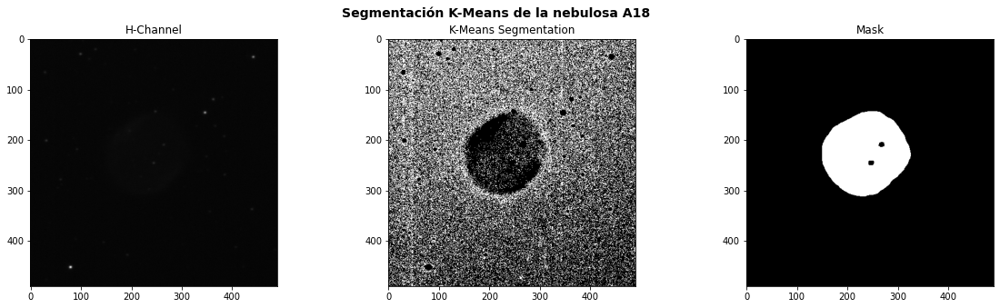

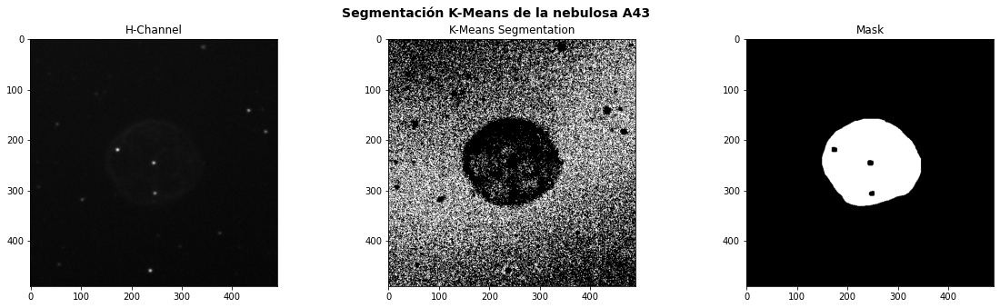

In [84]:
# Prueba normalizando los datos entre 0 y 1
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1)
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = False
plot_pne_name = ["A18", "A43"]

for im, mask, name in dataset:
    cntr, u, u0, d, jm, p, fpc, im_segm = apply_FCM(im[0], mask[0], name[0], plot=plot, rango=(0,3), c=5, m=2, error=0.005, maxiter=10, seed=42)
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)

    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"H-Channel")
        ax[1].imshow(im_segm[:,:,0], cmap = "gray")
        ax[1].set_title(f"K-Means Segmentation")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Mask")
        
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")

Jaccard: 0.1519
DICE: 0.2424
Accuracy: 0.829947675581493
Precisión: 0.4109
Sensibilidad: 0.2458



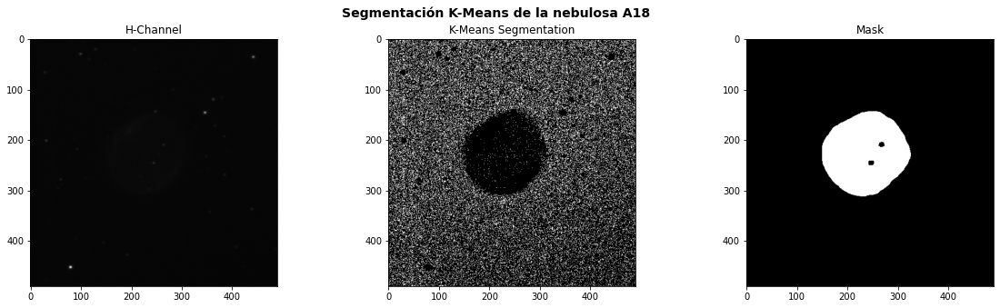

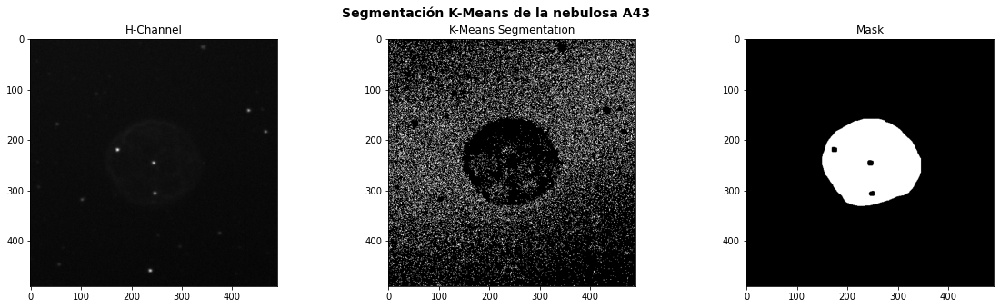

In [85]:
# Prueba sin normalizar los datos
transform = lambda x: tf.convert_to_tensor(x)

dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform=transform)
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = False
plot_pne_name = ["A18", "A43"]

for im, mask, name in dataset:
    cntr, u, u0, d, jm, p, fpc, im_segm = apply_FCM(im[0], mask[0], name[0], plot=plot, rango=(1,3), c=5, m=2, error=0.005, maxiter=10, seed=42)
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)

    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"H-Channel")
        ax[1].imshow(im_segm[:,:,0], cmap = "gray")
        ax[1].set_title(f"K-Means Segmentation")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Mask")
        
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")

Hemos incluido un parámetro de threshold ya que el algoritmo FCM indica el grado de pertenencia a uno de los clusters, así podemos elegir que grado mínimo de pertenencia exigimos tener a un píxel para que se considere de nebulosa.

Jaccard: 0.2554
DICE: 0.3624
Accuracy: 0.880472101901989
Precisión: 0.5339
Sensibilidad: 0.3543



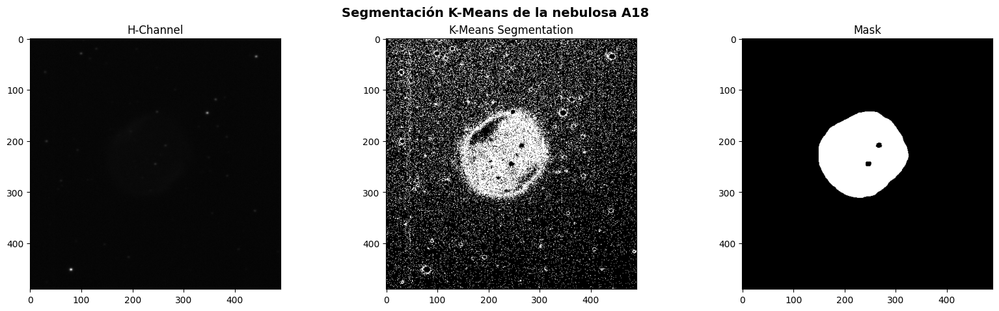

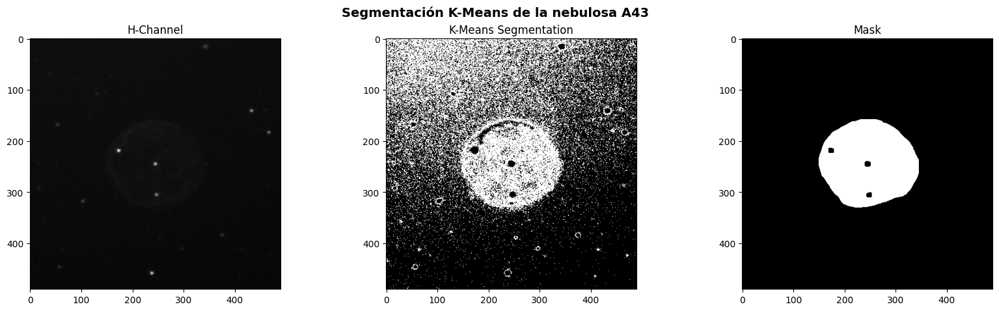

In [9]:
# Prueba sin normalizar los datos
transform = lambda x: tf.convert_to_tensor(x)

dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform=transform)
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = False
plot_pne_name = ["A18", "A43"]

for im, mask, name in dataset:
    cntr, u, u0, d, jm, p, fpc, im_segm = apply_FCM(im[0], mask[0], name[0], plot=plot, threshold=0.8, c=2, m=2, error=0.005, maxiter=10, seed=42)
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)

    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"H-Channel")
        ax[1].imshow(im_segm[:,:,0], cmap = "gray")
        ax[1].set_title(f"K-Means Segmentation")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Mask")
        
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")

### 2.3. Preprocesado
En las técnicas probadas de agrupamiento de datos podemos ver como se consiguen ciertos resultados que son bastante interesantes. En la mayoría de imágenes donde la nebulosa es minimamente visible en alguno de los canales, las técnicas de agrupamiento de datos consiguen extraer de cierto modo el objeto que representa a la nebulosa pero con mucho ruido en general, el ruido se debe sobretodo a que las imágenes presentan un fondo con puntos brillantes de pequeño tamaño (casi siempre son estrellas). 

Para solucionar esto, vamos a plantear una etapa de preprocesado a las imágenes para conseguir extraer el objeto que representa a la nebulosa pero con la menor cantidad de ruido posible.

#### 2.3.1. Filtro Gaussiano
Podemos aplicar un filtro gaussiano a las imágenes para suavizar en general toda la imagen y tratar de reducir el ruido existense. Vamos a probar a visualizar algunas imágenes con distintos valores de sigma (parámetro que indica la desviación típica del kernel gaussiano) y probaremos con ellos sobre las técnicas de agrupamiento de datos (con la configuración que mejores resultados hemos obtenido de cada una).

/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:162: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure

Jaccard: 0.0482
DICE: 0.0842
Accuracy: 0.20573907843341632
Precisión: 0.0563
Sensibilidad: 0.3167



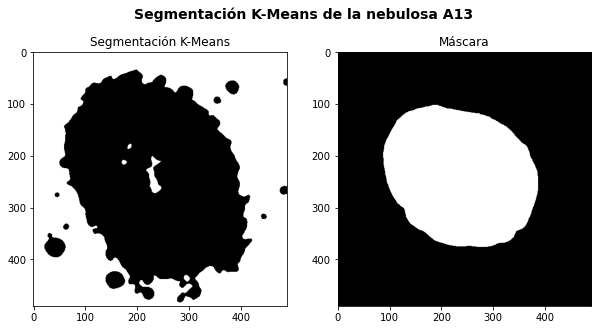

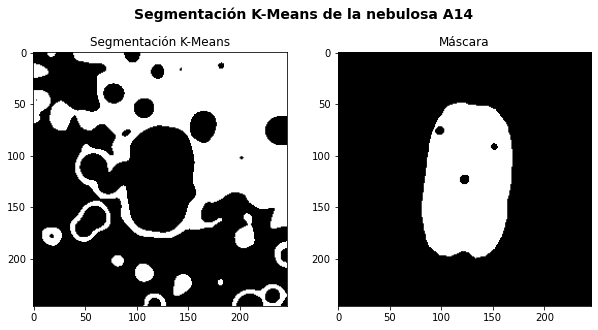

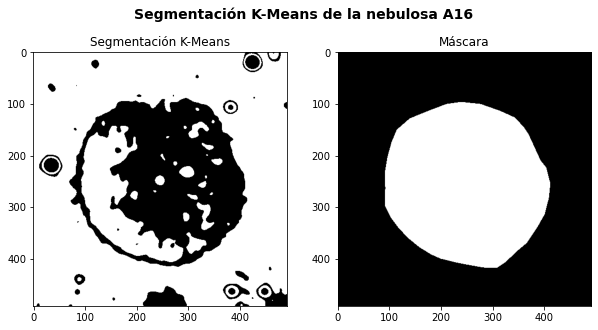

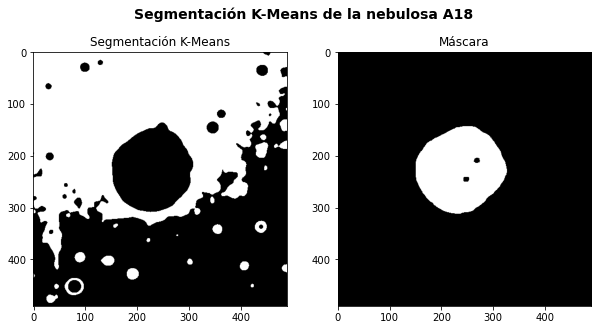

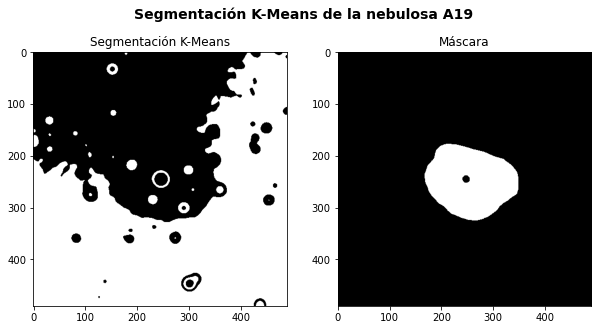

...

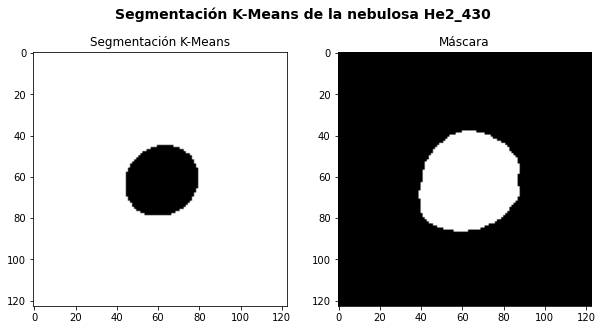

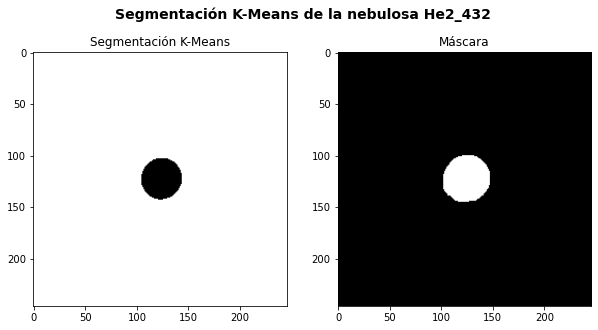

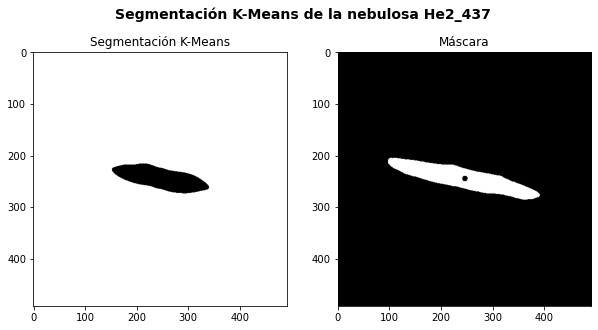

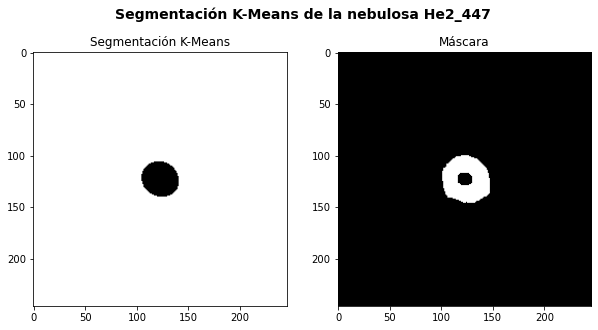

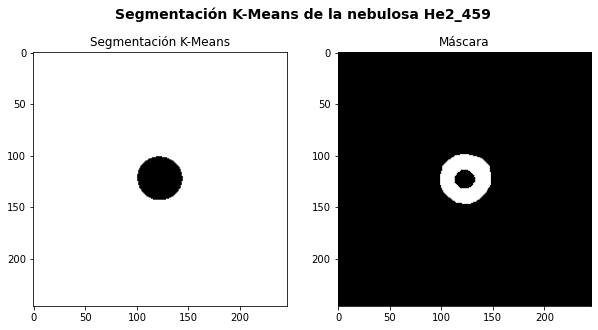

In [92]:
from scipy import ndimage
from skimage import exposure

# Definimos un pipeline de transformaciones para las imágenes
def transform(x, sigma, alpha = None, beta = None):
    x = tf.convert_to_tensor(x)
    # Aplicamos un filtro gaussiano a cada canal de la imagen
    x_filt = ndimage.gaussian_filter(x, sigma)
    x_filt[x == 0] = 0
    
    if beta and alpha:
        # Aumentamos el brillo y el contraste de la imagen (alpha es el parametro del brillo y beta el del contraste)
        # Ajustar el contraste utilizando la corrección gamma
        x_filt = exposure.adjust_gamma(x_filt, beta)

        # Ajustar el brillo utilizando la corrección logarítmica
        x_filt = exposure.adjust_log(x_filt, gain = alpha)
    
    return x_filt

# Prueba sin normalizar los datos
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform = transform, x_transform_parameters = {'sigma': 5})
# dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform = transform, x_transform_parameters = {'sigma': 13})
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = True
plot_pne_name = ["A18", "A43"]

for im, mask, name in dataset:
    kmeans, im_segm = apply_KMeans(im[0], mask[0], name[0], plot=plot, rango=(-2,2), n_clusters=7, max_iter=10, random_state=42)
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)
    
    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"H-Channel")
        ax[1].imshow(im_segm[:,:,0], cmap = "gray")
        ax[1].set_title(f"K-Means Segmentation")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Mask")
        
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")

Se han dejado estos resultados visibles para demostrar que aumentar el número de cluster consigue separar bastante bien lo que es fondo y lo que es nebulosa, pero es dificil definir unas reglas manualmente para distinguirlos y además hay que probar con varias combinaciones. 

Una idea es ampliar el método no supervisado con algún clasificador el cual sepa como interpretar los cada cluster a partir de la máscara, es decir, definir un clasificador sencillo que el mismo nos defina las reglas de como se consigue mejores valores en ciertas métricas.

Jaccard: 0.5365
DICE: 0.6519
Accuracy: 0.9082357746022077
Precisión: 0.6579
Sensibilidad: 0.7506



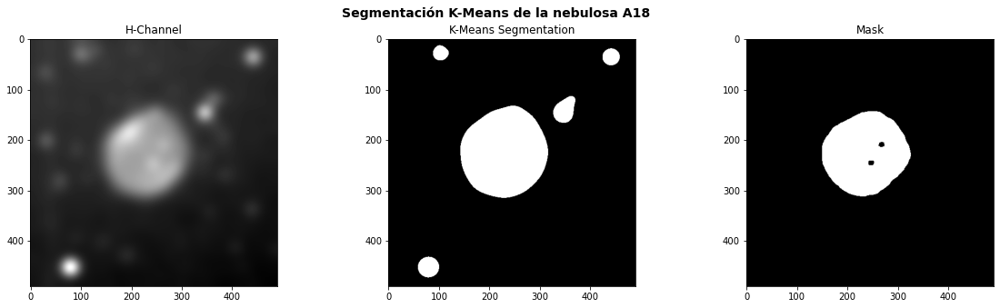

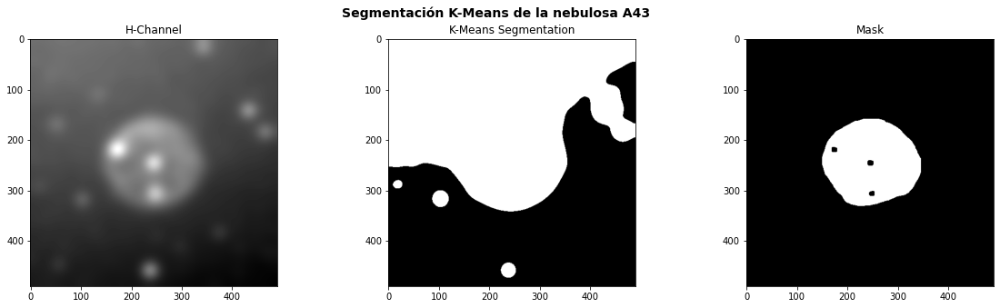

In [93]:
from scipy import ndimage
from skimage import exposure

# Definimos un pipeline de transformaciones para las imágenes
def transform(x, sigma, alpha = None, beta = None):
    x = tf.convert_to_tensor(x)
    # Aplicamos un filtro gaussiano a cada canal de la imagen
    x_filt = ndimage.gaussian_filter(x, sigma)
    x_filt[x == 0] = 0
    
    if beta and alpha:
        # Aumentamos el brillo y el contraste de la imagen (alpha es el parametro del brillo y beta el del contraste)
        # Ajustar el contraste utilizando la corrección gamma
        x_filt = exposure.adjust_gamma(x_filt, beta)

        # Ajustar el brillo utilizando la corrección logarítmica
        x_filt = exposure.adjust_log(x_filt, gain = alpha)
    
    return x_filt

# Prueba sin normalizar los datos
# dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform = transform, x_transform_parameters = {'sigma': 11, 'alpha': 2, 'beta': 1})
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform = transform, x_transform_parameters = {'sigma': 13})
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = False
plot_pne_name = ["A18", "A43"]

for im, mask, name in dataset:
    cntr, u, u0, d, jm, p, fpc, im_segm = apply_FCM(im[0], mask[0], name[0], plot=plot, threshold=0.6, c=2, m=2, error=0.005, maxiter=10, seed=42)
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)

    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"H-Channel")
        ax[1].imshow(im_segm[:,:,0], cmap = "gray")
        ax[1].set_title(f"K-Means Segmentation")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Mask")
        
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")

#### 2.3.2. Procesado morfológico
Podemos utilizar técnicas de procesado morfológico para tratar de detectar el fondo de estrellas de las imagenes y tratar de eliminar de cierta manera algunas de las mismas para facilitar a nuestros algoritmos a segmentar de mejor manera.

Jaccard: 0.3442
DICE: 0.4666
Accuracy: 0.8523347290578452
Precisión: 0.6193
Sensibilidad: 0.5645



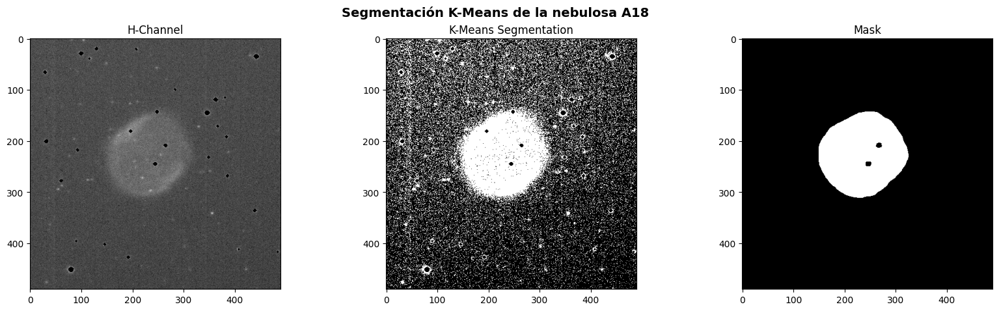

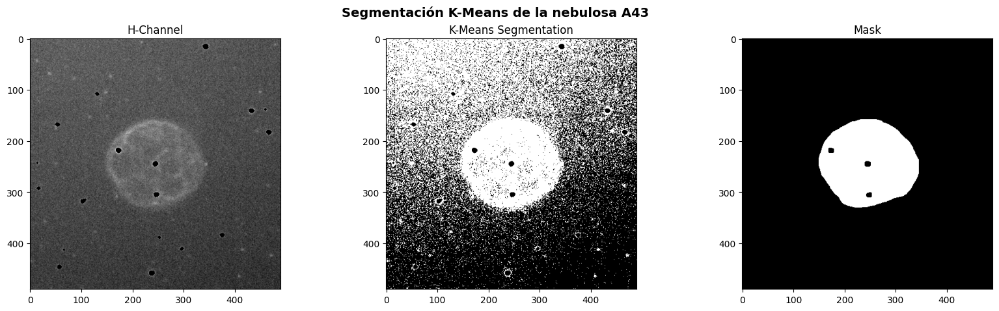

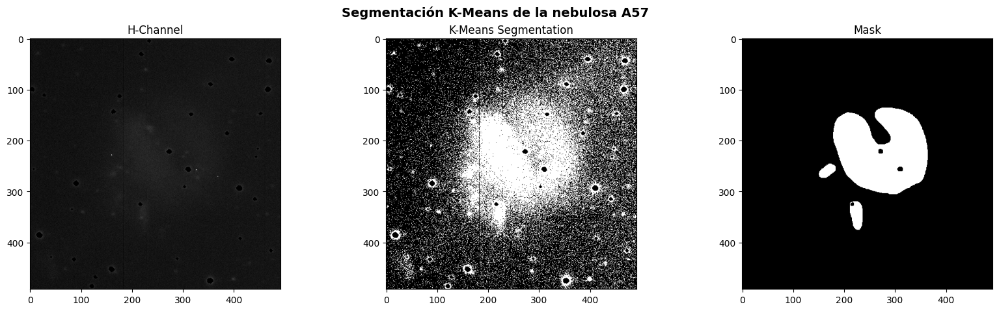

In [45]:
from scipy import ndimage
from skimage import exposure, morphology

# Definimos un pipeline de transformaciones para las imágenes
def transform(x, sigma, radius):
    x = tf.convert_to_tensor(x)
    x_preproc = np.copy(x)
    # Aplicamos un filtro gaussiano a cada canal de la imagen
    x_filt = ndimage.gaussian_filter(x, sigma)
    x_filt[x == 0] = 0
    
    # Puede ser interesante hacer pruebas con otros valores para ver cómo afecta al resultado.
    x_zonas_claras_peq = x > (x_filt + np.std(x))
    
    # Obtenemos la representación de un disco de radio 1.
    # Puede ser interesante hacer pruebas con otros valores del radio del disco para ver cómo afecta al resultado.
    selem = morphology.disk(radius = radius)
    
    x_zonas_claras_peq = ndimage.binary_opening(input=x_zonas_claras_peq, structure=selem)
    
    x_preproc = (x_preproc - np.min(x_preproc))
    x_preproc[x_zonas_claras_peq] = 0
    
    return x_preproc

# Prueba sin normalizar los datos
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform = transform, x_transform_parameters = {'sigma': 11, 'radius': 2})
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = False
plot_pne_name = ["A18", "A43", "A57"]

for im, mask, name in dataset:
    kmeans, im_segm = apply_KMeans(im[0], mask[0], name[0], plot=plot, n_clusters=2, max_iter=15, random_state=42)
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)
    
    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"H-Channel")
        ax[1].imshow(im_segm[:,:,0], cmap = "gray")
        ax[1].set_title(f"K-Means Segmentation")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Mask")
        
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")

También podemos combinar ambas técnicas para comprobar su funcionamiento, primero intentamos extraer de cierto modo las estrellas gracias a los operadores morfológicos y después le restamos a la imagen original el campo de estrellas extraido

Jaccard: 0.3345
DICE: 0.4563
Accuracy: 0.673387824919417
Precisión: 0.4210
Sensibilidad: 0.8295



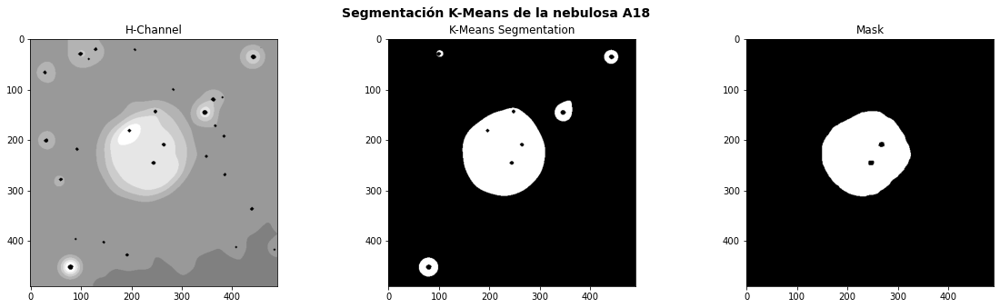

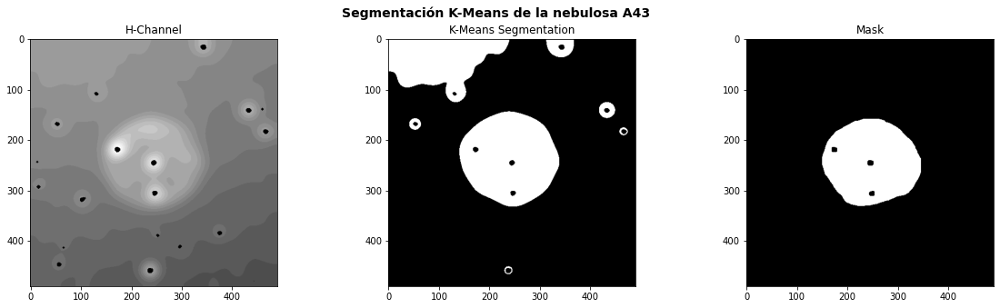

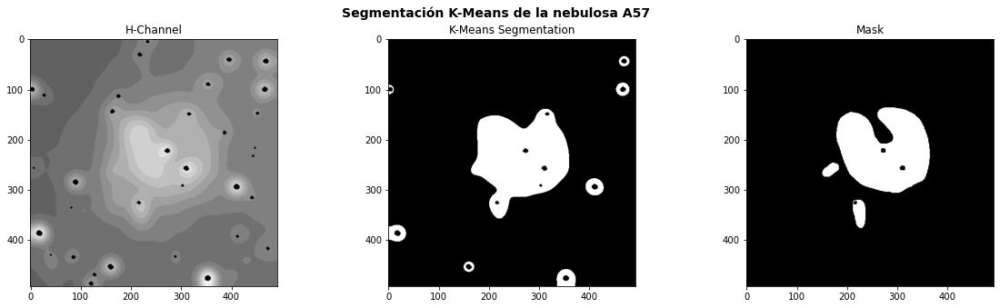

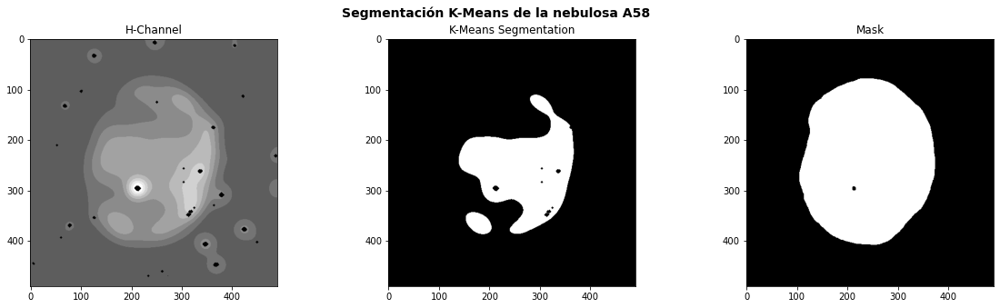

In [100]:
from scipy import ndimage
from skimage import exposure, morphology
# Definimos un pipeline de transformaciones para las imágenes
def transform(x, sigma_morph, sigma_gauss = 0, radius = 1, alpha = None, beta = None):
    x_norm = lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)) * 255
    x = x_norm(tf.convert_to_tensor(x))
    x_preproc = np.copy(x)
    # Aplicamos un filtro gaussiano a cada canal de la imagen
    x_filt = ndimage.gaussian_filter(x, sigma_morph)
    x_filt[x == 0] = 0
    
    # Puede ser interesante hacer pruebas con otros valores para ver cómo afecta al resultado.
    x_zonas_claras_peq = x > (x_filt + np.std(x))
    
    # Obtenemos la representación de un disco de radio 1.
    # Puede ser interesante hacer pruebas con otros valores del radio del disco para ver cómo afecta al resultado.
    selem = morphology.disk(radius = radius)
    
    x_zonas_claras_peq = ndimage.binary_opening(input=x_zonas_claras_peq, structure=selem)
    
    if sigma_gauss != 0:
        x_preproc = ndimage.gaussian_filter(x_preproc, sigma_gauss)
        x_preproc[x == 0] = 0

    x_preproc[x_zonas_claras_peq] = 0
    
    x_filt = tf.cast(x_preproc, tf.uint8)
    
    return x_filt

# Prueba sin normalizar los datos
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform = transform, x_transform_parameters = {'sigma_morph': 11, 'sigma_gauss': 13, 'radius': 2})
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = False
plot_pne_name = ["A18", "A43", "A57", "A58"]

for im, mask, name in dataset:
    threshold = np.percentile(im[0], 90)
    im_segm = (im >= threshold).astype(int)
    # cntr, u, u0, d, jm, p, fpc, im_segm = apply_FCM(im[0], mask[0], name[0], plot=plot, c=2, m=2, error=0.005, maxiter=10, seed=42, threshold=0.8)
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)
    
    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"H-Channel")
        ax[1].imshow(im_segm[0][:,:,0], cmap = "gray")
        ax[1].set_title(f"K-Means Segmentation")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Mask")
        
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")

## 3. Modelos de Machine Learning
En este apartado, vamos a ver algunos modelos de Machine Learning (ML), como pequeños autoencoders definidos por nosotros o algún modelo al que le podamos aplicar Transfer Learning para aprovecharnos de su arquitectura, los cuales nos pueden ser de gran utilidad a la hora de segmentar nuestras imágenes.

### 3.1. Autoencoders
Los autoencoder son redes neuronales (RRNN) que se pueden aplicar a diversas tareas de aprendizajes no supervisados. La capa de entrada y la capa de salida de un autoencoder tienen las mismas dimensiones debido a que el objetivo de estos es tratar de reconstruir la imagen de entrada después de haber pasado por un proceso de downsampling y por otro de upsampling. En la siguiente imagen se puede ver la arquitectura/funcionamiento de un autoencoder básico.

![autoencoder.png](images/autoencoder.png)

Como se puede observar, un autoencoder consta de 2 partes, un codificador y un decodificador. El codificador (o encoder) va a intentar reducir a un espacio latente toda la información de la imagen de la cual, más adelante, el decodificador va a intentar reconstruir la imagen original a partir de ese espacio latente representativo.

Los autoencoder que vamos a utilizar, debido a que estamos trabajando con imágenes, son los autoencoders convolucionales (arquitectura de autoencoder pero con capas convolucionales).

Como tenemos imágenes de distintos tamaños, vamos a procesar las imágenes en bloques (relativamente pequeños), con las dimensiones correspondientes para la entrada del autoencoder, para no tener ningún problema a la hora de introducir las imágenes en nuestro modelo.

El objetivo de nuestro autoencoder va a ser detectar patrones o texturas en distintas regiones de la imagen que permitan reducir el ruido de la misma.

#### 3.1.1. Autoencoder procesamiento por ventanas

In [94]:
import tensorflow as tf
from tensorflow import keras

# Definimos una clase para que sea más facil crear/modificar nuestro modelo y tengamos toda la información de una manera más accesible
class ConvAutoencoder(tf.keras.Model):
    """
    Clase para un autoencoder convolucional.
    
    Parámetros:
    block_size (int, opcional): Tamaño del bloque de la imagen. Por defecto es 128.
    conv_encoder (Model, opcional): Modelo del codificador convolucional. Si no se especifica, se crea uno por defecto.
    conv_decoder (Model, opcional): Modelo del decodificador convolucional. Si no se especifica, se crea uno por defecto.
    **kwargs: Parámetros adicionales para el modelo.
    """
    def __init__(self, block_size=128, conv_encoder=None, conv_decoder=None, **kwargs):
        super(ConvAutoencoder, self).__init__()
        self.block_size = block_size  # Tamaño del bloque de la imagen
        
        # Definimos el codificador convolucional
        if conv_encoder:
            self.conv_encoder = conv_encoder
        else:
            inputs = keras.layers.Input(shape=[block_size, block_size, 1])

            x = keras.layers.Dropout(rate=0.1)(inputs)  # Capa de dropout
            
            # Capas convolucionales y de pooling
            x = keras.layers.Conv2D(filters=8, kernel_size=5, padding="same", activation="relu")(x)
            x = keras.layers.MaxPool2D(pool_size=2)(x)
            
            x = keras.layers.Conv2D(filters=16, kernel_size=5, padding="same", activation="relu")(x)
            x = keras.layers.MaxPool2D(pool_size=2)(x)
            
            x = keras.layers.Conv2D(filters=32, kernel_size=5, padding="same", activation="relu")(x)
            x = keras.layers.MaxPool2D(pool_size=2)(x)
            
            x = keras.layers.Conv2D(filters=64, kernel_size=5, padding="same", activation="relu")(x)
            x = keras.layers.MaxPool2D(pool_size=2)(x)
            
            self.conv_encoder = keras.models.Model(inputs=inputs, outputs=x, name="convolutional_encoder")  # Modelo del codificador convolucional
        
        # Definimos el decodificador convolucional
        if conv_decoder:
            self.conv_decoder = conv_decoder
        else:
            inputs = keras.layers.Input(shape=[int(block_size/2**4), int(block_size/2**4), 64])
            
            # Capas convolucionales transpuestas
            x = keras.layers.Conv2DTranspose(filters=64, kernel_size=5, strides=2, padding="same", activation="relu", input_shape=[int(block_size/2**4), int(block_size/2**4), 64])(inputs)
            
            x = keras.layers.Conv2DTranspose(filters=32, kernel_size=5, strides=2, padding="same", activation="relu")(x)
            
            x = keras.layers.Conv2DTranspose(filters=16, kernel_size=5, strides=2, padding="same", activation="relu")(x)
            
            x = keras.layers.Conv2DTranspose(filters=1, kernel_size=5, strides=2, padding="same", activation="sigmoid")(x)
            
            x = keras.layers.Reshape(target_shape=[block_size, block_size, 1])(x)  # Redimensionar la salida para que tenga las mismas dimensiones que la imagen original
            
            self.conv_decoder = keras.models.Model(inputs=inputs, outputs=x, name="convolutional_decoder")  # Modelo del decodificador convolucional

    @tf.function
    def call(self, inputs):
        """
        Define la pasada hacia adelante del modelo.
        
        Parámetros:
        inputs (np.array): Imágenes de entrada.
        
        Devuelve:
        reconstructed (np.array): Imágenes reconstruidas.
        """
        z = self.conv_encoder(inputs)  # Codifica las imágenes de entrada
        reconstructed = self.conv_decoder(z)  # Decodifica las imágenes codificadas
        return reconstructed

# Creamos una instancia de nuestro modelo y lo mostramos
block_size=64
conv_autoencoder = ConvAutoencoder(block_size=block_size)
conv_autoencoder.build((None, block_size, block_size, 1))
conv_autoencoder.summary()

Model: "conv_autoencoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
convolutional_encoder (Funct (None, 4, 4, 64)          67520     
_________________________________________________________________
convolutional_decoder (Funct (None, 64, 64, 1)         166913    
Total params: 234,433
Trainable params: 234,433
Non-trainable params: 0
_________________________________________________________________


In [95]:
# Mostramos la arquitectura del codificador
conv_autoencoder.conv_encoder.summary()

Model: "convolutional_encoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 64, 64, 1)]       0         
_________________________________________________________________
dropout (Dropout)            (None, 64, 64, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 64, 64, 8)         208       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 32, 32, 8)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 16)        3216      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 3

In [96]:
# Mostramos la arquitectura del descodificador
conv_autoencoder.conv_decoder.summary()

Model: "convolutional_decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 4, 4, 64)]        0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 64)          102464    
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 16, 16, 32)        51232     
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 32, 32, 16)        12816     
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 64, 64, 1)         401       
_________________________________________________________________
reshape (Reshape)            (None, 64, 64, 1)         0         
Total params: 166,913
Trainable params: 166,913
Non-trainable params: 0
_______________________________________

Vamos a entrenar nuestro modelo, para ello vamos a procesar unas cuantas imágenes, de una en una, para obtener los bloques de tamaño fijo con los cuales más tarde poder entrenar.

In [97]:
class DiceLoss(tf.keras.losses.Loss):
    def __init__(self, smooth=1e-6, gama=2):
        super(DiceLoss, self).__init__()
        self.name = 'NDL'
        self.smooth = smooth
        self.gama = gama

    def call(self, y_true, y_pred):
        y_true, y_pred = tf.cast(
            y_true, dtype=tf.float32), tf.cast(y_pred, tf.float32)
        nominator = 2 * \
            tf.reduce_sum(tf.multiply(y_pred, y_true)) + self.smooth
        denominator = tf.reduce_sum(
            y_pred ** self.gama) + tf.reduce_sum(y_true ** self.gama) + self.smooth
        result = 1 - tf.divide(nominator, denominator)
        return result
    
class CombinedLoss(tf.keras.losses.Loss):
    def __init__(self, alpha=0.5, smooth=1e-6):
        super(CombinedLoss, self).__init__()
        self.alpha = alpha
        self.smooth = smooth
        self.dice_loss = DiceLoss(smooth)
        self.bce = tf.keras.losses.BinaryCrossentropy()

    def call(self, y_true, y_pred):
        y_true = tf.cast(y_true, dtype=tf.float32)
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        dice_loss = self.dice_loss(y_true, y_pred)
        bce_loss = self.bce(y_true, y_pred)
        loss = self.alpha * bce_loss + (1 - self.alpha) * dice_loss
        return loss

block_size=256
conv_autoencoder = ConvAutoencoder(block_size=block_size)

conv_autoencoder.build((None, block_size, block_size, 1))
# Preparamos el autoencoder para poder realizar posteriormente el proceso de entrenamiento.
conv_autoencoder.compile(loss=CombinedLoss(smooth=1e-5), optimizer=keras.optimizers.Adam(learning_rate=0.001))

In [98]:
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1)

rd.seed(42)
train_index = rd.sample(range(len(dataset)), int(len(dataset)*0.8))

# Obtenemos los bloques de la imagen que se usarán para el proceso de entrenamiento o ajuste de parámetros.
im_blocks = np.array([], float)
block_start_increment = int(block_size * 0.75)

for im_index in train_index:
    im = dataset[im_index][0][0]
    for tmp_start_row in range(0, im.shape[0], block_start_increment):
        for tmp_start_col in range(0, im.shape[1], block_start_increment):
            
            end_row = min(tmp_start_row + block_size, im.shape[0])
            end_col = min(tmp_start_col + block_size, im.shape[1])
            
            start_row = end_row - block_size
            start_col = end_col - block_size   
            
            if (start_row < 0):
                start_row = 0
                end_row = im.shape[0]
                
            if (start_col < 0):
                start_col = 0
                end_col = im.shape[1]            
            
            current_im_block = np.zeros([block_size, block_size, 1], float)
            
            # Escalamos los valores para que los datos de entrada se correspondan con el formato de salida del autocodificador.
            # La salida del autocodificador es un valor entre 0 y 1.        
            current_im_block[0:end_row - start_row, 0:end_col - start_col, :] = im[start_row:end_row, start_col:end_col, :]
            
            # Si el bloque actual no tiene ningún píxel con datos reales no lo usamos para el entrenamiento.
            # Se podría usar para entrenar pero podría afectar en parte a lo que aprende la red y posiblemente distorsionaría el modelo interno del espacio de entrada.
            # También se podría descartar cualquier bloque que tenga algún píxel sin datos reales, pero se estarían desaprovechando datos reales para el entrenamiento.
            # Para este ejemplo se usan todos los bloques salvo los que no tengan ningún dato, pero se pueden realizar pruebas 
            # cambiando este paso para comprobar si afecta a los resultados de la red.
            if np.max(current_im_block) == 0:
                continue        

            if np.size(im_blocks) == 0:
                im_blocks = np.array([current_im_block], float)
            else:
                im_blocks = np.vstack((im_blocks, [current_im_block]))  

In [99]:
# Realizamos el proceso de entrenamiento con los bloques de la imagen obtenidos en el paso anterior.
history = conv_autoencoder.fit(x=im_blocks, y=im_blocks, epochs=200)

Epoch 1/200


14/14 [==============================] - 18s 158ms/step - loss: 0.7852
Epoch 2/200
14/14 [==============================] - 1s 50ms/step - loss: 0.5837
Epoch 3/200
14/14 [==============================] - 1s 50ms/step - loss: 0.4277
Epoch 4/200
14/14 [==============================] - 1s 50ms/step - loss: 0.2907
Epoch 5/200
14/14 [==============================] - 1s 50ms/step - loss: 0.1883
Epoch 6/200
14/14 [==============================] - 1s 50ms/step - loss: 0.1613
Epoch 7/200
14/14 [==============================] - 1s 50ms/step - loss: 0.1271
Epoch 8/200
14/14 [==============================] - 1s 51ms/step - loss: 0.1047
Epoch 9/200
14/14 [==============================] - 1s 51ms/step - loss: 0.0960
Epoch 10/200
14/14 [==============================] - 1s 51ms/step - loss: 0.0923
Epoch 11/200
14/14 [==============================] - 1s 51ms/step - loss: 0.0943
Epoch 12/200
14/14 [==============================] - 1s 51ms/step - loss: 0.0959
Epoch 13/200
14/14 [===============

In [186]:
from matplotlib import pyplot as plt
import skimage.morphology
import scipy
from skimage import exposure

def generate_combinations(autoencoder_output, thresholds, plot=False):
    combinations = []
    for  threshold in thresholds:
        threshold = np.percentile(autoencoder_output, threshold) 
        im_threshold = (autoencoder_output >= threshold).astype(int)
        if np.sum(im_threshold) == im_threshold.shape[0] * im_threshold.shape[1]:
            print(f"El umbral {threshold} no ha segmentado la imagen.")
            print(f"Probamos combinaciones excesivamente altas")
            combinations = []
            for threshold in np.arange(99, 99.9, 0.15).tolist():
                threshold = np.percentile(autoencoder_output, threshold) 
                im_threshold = (autoencoder_output >= threshold).astype(int)
                combinations.append(im_threshold)
            break
            
        combinations.append(im_threshold)
    
    # Si plot es True, mostrar todas las combinaciones
    if plot:
        for i, combinacion in enumerate(combinations):
            plt.figure()
            plt.imshow(combinacion[:,:,0], cmap='gray')
            plt.title(f'Combinación {i+1}')
        plt.show()
    
    return combinations

def apply_conv_autoencoder(conv_autoencoder, im, block_size):
    im_output = np.zeros(im.shape, int)

    # Al procesar la imagen por bloques es posible que en la salida se produzcan algunos efectos en los límites entre bloques adyacentes.
    # Pueden aparecer zonas en la imagen de salida con valores bastante distintos a los de los píxeles próximos.
    # Para evitar este problema podemos hacer que los bloques estén solapados y al generar la imagen de salida 
    # descartamos los píxeles de los bordes de cada bloque. 
    # Dichos píxeles se pueden averiguar a partir de la salida del bloque solapado que esté centrado en esos píxeles.
    min_distance_to_block_borders = 1
    block_start_increment = int(block_size * 0.33) + 1


    for tmp_start_row in range(0, im.shape[0], block_start_increment):

        for tmp_start_col in range(0, im.shape[1], block_start_increment):
        
            end_row = min(tmp_start_row + block_size, im.shape[0])
            end_col = min(tmp_start_col + block_size, im.shape[1])
        
            start_row = end_row - block_size
            start_col = end_col - block_size   
        
            if (start_row < 0):
                start_row = 0
                end_row = im.shape[0]
            
            if (start_col < 0):
                start_col = 0
                end_col = im.shape[1]            
      
            current_im_block = np.zeros([block_size, block_size, 1], float)

            # Escalamos los valores para que los datos de entrada se correspondan con el formato de salida del autocodificador.
            # La salida del autocodificador es un valor entre 0 y 1.        
            current_im_block[0:end_row - start_row, 0:end_col - start_col, :] = np.array(im[start_row:end_row, start_col:end_col, :], float)
        
            current_im_block = np.array([current_im_block], float)
        
            current_im_block_output = np.array(conv_autoencoder.predict(current_im_block, verbose=False) * 255, int)
            # current_im_block_output = exposure.adjust_gamma(current_im_block_output, 0.5)

            if min_distance_to_block_borders > 0:
                current_im_block_output[0, 0:min_distance_to_block_borders, :] = 0
                current_im_block_output[0, -min_distance_to_block_borders:, :] = 0
                current_im_block_output[0, :, 0:min_distance_to_block_borders] = 0
                current_im_block_output[0, :, -min_distance_to_block_borders:] = 0
                        
            im_output[start_row:end_row, start_col:end_col, :] = np.fmax(im_output[start_row:end_row, start_col:end_col, :], current_im_block_output[0,0:end_row - start_row, 0:end_col - start_col, :])
            
            
    # En este punto ya se tiene la imagen de salida.
    # Pero, como se mencionó anteriormente, algunos píxeles de la imagen de entrada pueden no corresponderse con un valor real.
    # Al aplicar la red es posible que algunos de esos píxeles se hayan modificado.
    # Dependiendo de la aplicación puede no ser un problema, por ejemplo si el filtro se aplica para facilitar un análisis visual.  
    # Pero para asegurar que sigan teniendo el valor 0 se puede aplicar el siguiente comando.
    im_output[im == 0] = 0     
    
    return im_output

# Procesa una imagen con un autocodificador.
# Devuelve la imagen original, la salida del autocodificador, la salida tras aplicar un umbral, y la imagen binaria final.
def process_im_with_autoencoder(im, conv_autoencoder, block_size, thresholds = [92.5]): 
    # Aplica el autoencoder a la imagen para obtener la imagen segmentada.
    autoencoder_output = apply_conv_autoencoder(conv_autoencoder, im, block_size)
    
    # Obtenemos una imagen binaria a partir de la salida de la red neuronal, seleccionando los píxeles con un valor de salida más alto.
    # Es interesante realizar pruebas con otros valores para el umbral.
    if len(thresholds) > 1:
        combinations = generate_combinations(autoencoder_output, thresholds, plot=False)
        
        compactaciones = []
        max_areas = []
        sum_areas = []
        num_componentes_peq = []
        for image in combinations:
            compactacion, num_obj, area_max, sum_area, num_comp_peq = calcular_atributos(image)
            compactaciones.append(compactacion)
            max_areas.append(area_max)
            sum_areas.append(area_max)
            num_componentes_peq.append(num_comp_peq)
        
        media_compactaciones = np.median(compactaciones)
        media_areas = np.median(max_areas)
        # Calcular la diferencia absoluta entre cada compactación y la media
        # diferencias = np.abs(np.array(compactaciones) - media_compactaciones)
        diferencias_comp = np.abs(np.array(compactaciones) - media_compactaciones)
        diferencias_areas = np.abs(np.array(max_areas) - media_areas)
        # Normalizar las diferencias y el número de objetos para que tengan la misma escala
        compactaciones_norm = (compactaciones - np.min(compactaciones)) / (np.max(compactaciones) - np.min(compactaciones))
        areas_norm = (max_areas - np.min(max_areas)) / (np.max(max_areas) - np.min(max_areas))
        # num_objetos_norm = (num_objetos - np.min(num_objetos)) / (np.max(num_objetos) - np.min(num_objetos))
        num_componentes_peq_norm = (num_componentes_peq - np.min(num_componentes_peq)) / (np.max(num_componentes_peq) - np.min(num_componentes_peq))
        
        puntuaciones = compactaciones_norm + num_componentes_peq_norm
        
        # Seleccionar la imagen con la compactación más cercana a la media
        im_threshold = combinations[np.argmin(puntuaciones)]
    else:
        threshold = np.percentile(autoencoder_output, thresholds[0]) 
        im_threshold = (autoencoder_output >= threshold).astype(int)

    # Podemos aplicar técnicas de procesado morfológico como las explicadas en apartados anteriores,
    # para tratar de reducir algunos efectos no deseados en la salida, como regiones pequeñas no conectadas al resto.
    # En caso de utilizar muchas más imágenes para entrenar la red, esto podría no ser necesario, 
    # pero en cualquier caso es interesante conocer la posibilidad de aplicar estas técnicas también en la parte final del procesado de imágenes.
    # En este caso obtenemos la representación de un disco para aplicarlo en una operación de procesado morfológico.
    # Puede ser interesante hacer pruebas con otros valores del radio del disco para ver cómo afecta al resultado.
    # Es interesante realizar pruebas con distintas operaciones de procesado morfológico y con distintos parámetros.
    # Este paso tiene por qué ser estrictamente necesario, se pueden realizar pruebas y seleccionar la opción que consideréis más adecuada.
    # En general puede depender del resto de opciones y parámetros que se hayan aplicado previamente.
    selem = skimage.morphology.disk(radius = 7)
    im_segm_binaria = scipy.ndimage.binary_opening(input=im_threshold[:,:,0], structure=selem).astype(int)
    if np.sum(im_segm_binaria) == 0:
        print("No se ha segmentado la imagen")
        im_segm_binaria = im_threshold[:,:,0]
    return im, autoencoder_output, im_threshold, im_segm_binaria


# Visualiza el resultado obtenido al aplicar el autocodificador a una imagen.
def show_conv_autoencoder_output(im_name, conv_autoencoder, block_size, mask, show_intermediate_steps=False, thresholds = [92.5]):

    im, autoencoder_output, im_threshold, im_segm_binaria = process_im_with_autoencoder(im_name, conv_autoencoder, block_size, thresholds = thresholds)
    
    # Este comando es útil para que la visualización sea en blanco y negro.
    plt.gray()

    if show_intermediate_steps:
        # Para facilitar la comparación entre la imagen original y la imagen filtrada podemos mostrar las dos imágenes.
        fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(18,18))
        
        # Visualiza la imagen.
        ax1.imshow(im[:,:,0])

        # Visualiza la imagen de salida de la red neuronal.
        ax2.imshow(autoencoder_output[:,:,0])
        del autoencoder_output
    
        ax3.imshow(im_threshold[:,:,0])
        del im_threshold

        ax4.imshow(im_segm_binaria)
        
        ax5.imshow(mask)
        del mask
    
    else:
        # Para facilitar la comparación entre la imagen original y la imagen filtrada podemos mostrar las dos imágenes.
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,14))            

        # Visualiza la imagen.
        ax1.imshow(im)   
        del im

        ax2.imshow(im_segm_binaria)
        
    return im_segm_binaria

El umbral 0.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas


<Figure size 432x288 with 0 Axes>

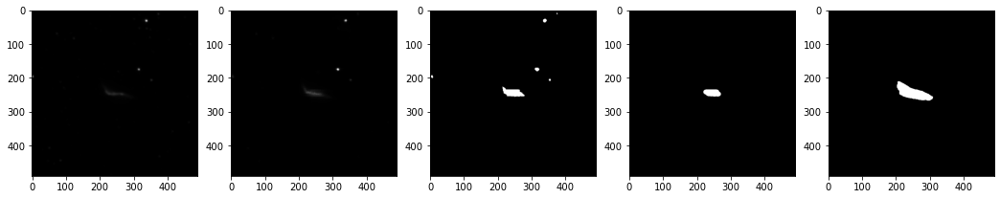

In [187]:
a = show_conv_autoencoder_output(dataset[33][0][0], conv_autoencoder, block_size, dataset[33][1][0][:,:,0], show_intermediate_steps=True, thresholds=[85, 87, 89, 91, 93, 99])


Aplicar alguna regla que limpie los objetos que no llegan a cierto tamaño comparado respecto al objeto más grande (nebulosa)

['A3']


<Figure size 432x288 with 0 Axes>

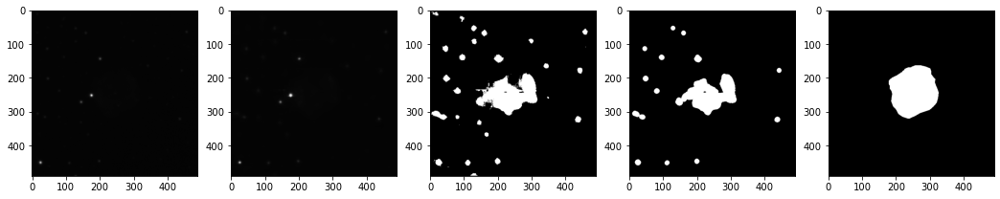

Jaccard: 0.4616	DICE: 0.6317	Precisión: 0.6942	Sensibilidad: 0.5795

['A46']


<Figure size 432x288 with 0 Axes>

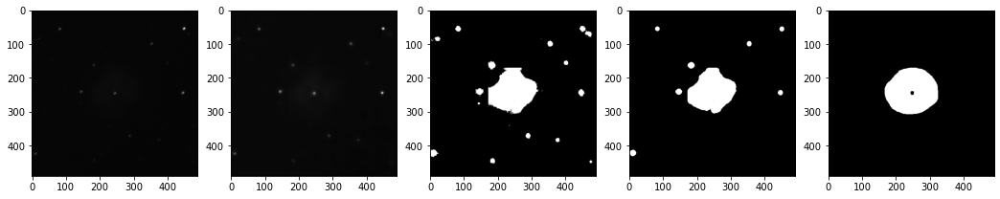

Jaccard: 0.6955	DICE: 0.8204	Precisión: 0.8852	Sensibilidad: 0.7644

['A57']


<Figure size 432x288 with 0 Axes>

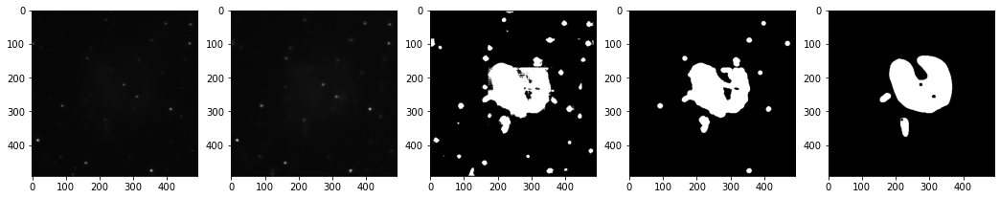

Jaccard: 0.6650	DICE: 0.7988	Precisión: 0.8190	Sensibilidad: 0.7796

['A68']


<Figure size 432x288 with 0 Axes>

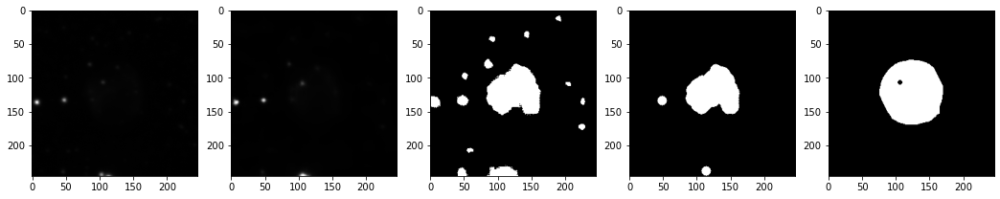

Jaccard: 0.5571	DICE: 0.7156	Precisión: 0.9249	Sensibilidad: 0.5835

['A70']


<Figure size 432x288 with 0 Axes>

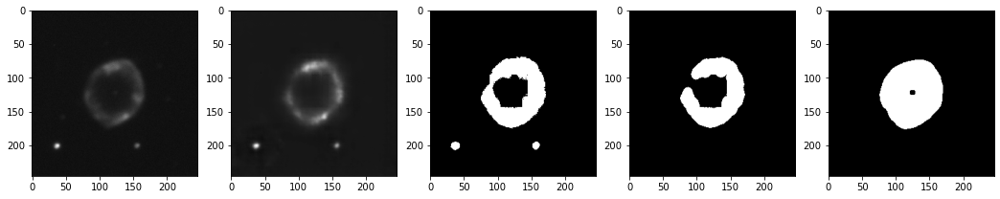

Jaccard: 0.6441	DICE: 0.7836	Precisión: 0.9390	Sensibilidad: 0.6723

['A73']


<Figure size 432x288 with 0 Axes>

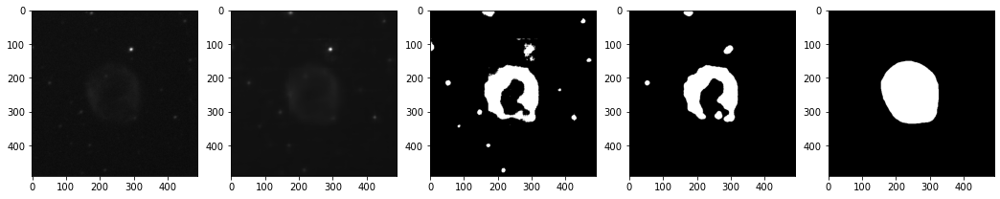

Jaccard: 0.5566	DICE: 0.7152	Precisión: 0.9263	Sensibilidad: 0.5824

['BV5_1']
El umbral 0.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas


<Figure size 432x288 with 0 Axes>

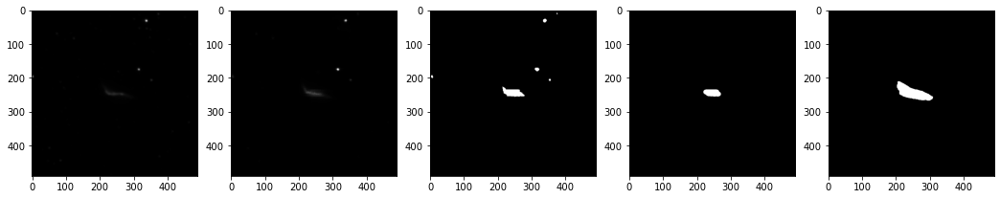

Jaccard: 0.3094	DICE: 0.4728	Precisión: 1.0000	Sensibilidad: 0.3094

['Dd1']


<Figure size 432x288 with 0 Axes>

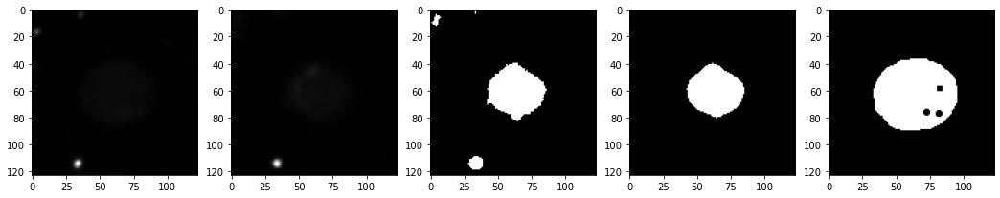

Jaccard: 0.4429	DICE: 0.6140	Precisión: 0.9747	Sensibilidad: 0.4481

['He1_1']


<Figure size 432x288 with 0 Axes>

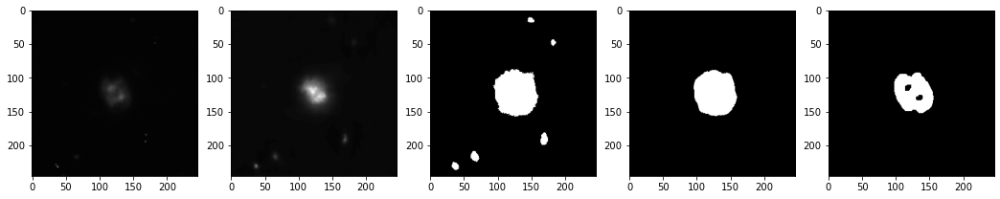

Jaccard: 0.7275	DICE: 0.8423	Precisión: 0.7296	Sensibilidad: 0.9960

['He2_429']


<Figure size 432x288 with 0 Axes>

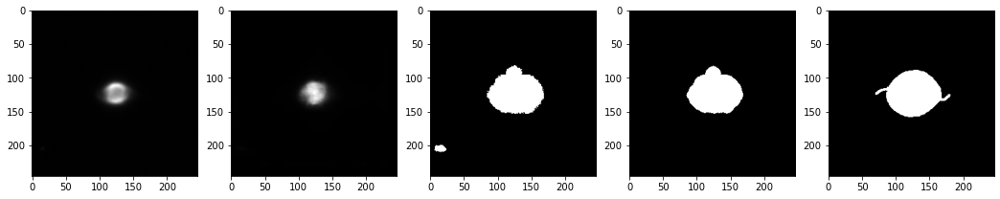

Jaccard: 0.8545	DICE: 0.9215	Precisión: 0.9645	Sensibilidad: 0.8822

['He2_430']
El umbral 0.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
No se ha segmentado la imagen


/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:124: RuntimeWarning: invalid value encountered in true_divide


<Figure size 432x288 with 0 Axes>

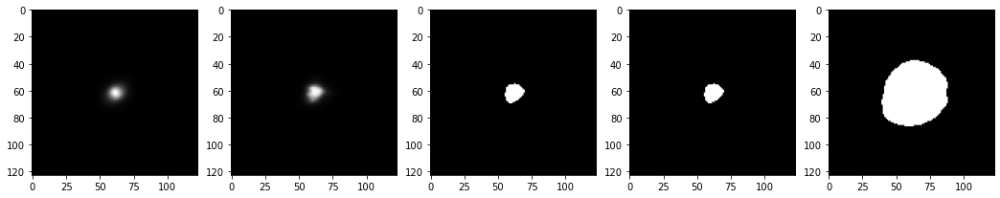

Jaccard: 0.0811	DICE: 0.1504	Precisión: 1.0000	Sensibilidad: 0.0811

['He2_447']
El umbral 0.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
No se ha segmentado la imagen


<Figure size 432x288 with 0 Axes>

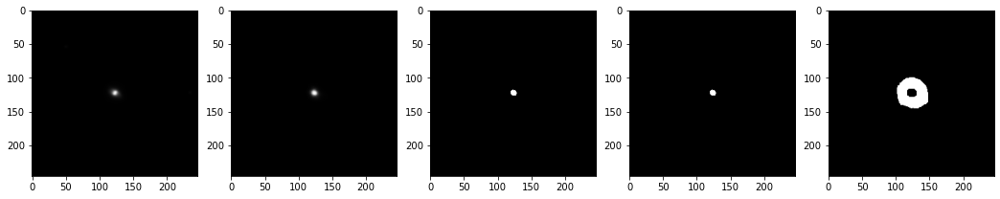

Jaccard: 0.0000	DICE: 0.0006	Precisión: 0.0000	Sensibilidad: 0.0000

Jaccard: 0.4996
DICE: 0.6222
Accuracy: 0.9558410235260576
Precisión: 0.8215
Sensibilidad: 0.5565



In [188]:
test_index = [i for i in list(range(len(dataset))) if i not in train_index]
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}
for im_index in test_index:
    im, mask, name = dataset[im_index]
    print(name)
    im_segm = show_conv_autoencoder_output(im[0], conv_autoencoder, block_size, mask[0][:,:,0], show_intermediate_steps=True, thresholds=list(range(90,95)))
    # Visualiza la máscara.
    plt.imshow(mask[0][:,:,0])
    plt.show()
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = True)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)

print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")

#### 3.1.2. Autoencoder procesamiento imagenes padding

Para intentar procesar todas las imágenes enteras, sin tener que recorrer por ventanas, vamos a añadir padding a nuestras imágenes hasta alcanzar el máximo tamaño de imagen el cual es 980x980

In [197]:
import tensorflow as tf
from tensorflow import keras

# Definimos una clase para que sea más facil crear/modificar nuestro modelo y tengamos toda la información de una manera más accesible
class ConvAutoencoder(tf.keras.Model):
    """
    Clase para un autoencoder convolucional.
    
    Parámetros:
    block_size (int, opcional): Tamaño del bloque de la imagen. Por defecto es 128.
    conv_encoder (Model, opcional): Modelo del codificador convolucional. Si no se especifica, se crea uno por defecto.
    conv_decoder (Model, opcional): Modelo del decodificador convolucional. Si no se especifica, se crea uno por defecto.
    **kwargs: Parámetros adicionales para el modelo.
    """
    def __init__(self, block_size=128, conv_encoder=None, conv_decoder=None, **kwargs):
        super(ConvAutoencoder, self).__init__()
        self.block_size = block_size  # Tamaño del bloque de la imagen
        
        # Definimos el codificador convolucional
        if conv_encoder:
            self.conv_encoder = conv_encoder
        else:
            inputs = keras.layers.Input(shape=[block_size, block_size, 1])

            x = keras.layers.Dropout(rate=0.1)(inputs)  # Capa de dropout
            
            # Capas convolucionales y de pooling
            x = keras.layers.Conv2D(filters=8, kernel_size=5, padding="same", activation="relu")(x)
            x = keras.layers.MaxPool2D(pool_size=2)(x)
            
            x = keras.layers.Conv2D(filters=16, kernel_size=5, padding="same", activation="relu")(x)
            x = keras.layers.MaxPool2D(pool_size=2)(x)
            
            x = keras.layers.Conv2D(filters=32, kernel_size=5, padding="same", activation="relu")(x)
            x = keras.layers.MaxPool2D(pool_size=2)(x)
            
            x = keras.layers.Conv2D(filters=64, kernel_size=5, padding="same", activation="relu")(x)
            x = keras.layers.MaxPool2D(pool_size=2)(x)
            
            self.conv_encoder = keras.models.Model(inputs=inputs, outputs=x, name="convolutional_encoder")  # Modelo del codificador convolucional
        
        # Definimos el decodificador convolucional
        if conv_decoder:
            self.conv_decoder = conv_decoder
        else:
            inputs = keras.layers.Input(shape=[int(block_size/2**4), int(block_size/2**4), 64])
            
            # Capas convolucionales transpuestas
            x = keras.layers.Conv2DTranspose(filters=64, kernel_size=5, strides=2, padding="same", activation="relu")(inputs)
            
            x = keras.layers.Conv2DTranspose(filters=32, kernel_size=5, strides=2, padding="same", activation="relu")(x)
            
            x = keras.layers.Conv2DTranspose(filters=16, kernel_size=5, strides=2, padding="same", activation="relu")(x)
            
            x = keras.layers.Conv2DTranspose(filters=1, kernel_size=5, strides=2, padding="same", activation="sigmoid")(x)

            x = keras.layers.ZeroPadding2D(padding=((block_size - x.shape[1])//2, (block_size - x.shape[2])//2))(x)
            
            self.conv_decoder = keras.models.Model(inputs=inputs, outputs=x, name="convolutional_decoder")  # Modelo del decodificador convolucional

    @tf.function
    def call(self, inputs):
        """
        Define la pasada hacia adelante del modelo.
        
        Parámetros:
        inputs (np.array): Imágenes de entrada.
        
        Devuelve:
        reconstructed (np.array): Imágenes reconstruidas.
        """
        z = self.conv_encoder(inputs)  # Codifica las imágenes de entrada
        reconstructed = self.conv_decoder(z)  # Decodifica las imágenes codificadas
        return reconstructed

# Creamos una instancia de nuestro modelo y lo mostramos
block_size=980
conv_autoencoder = ConvAutoencoder(block_size=block_size)
conv_autoencoder.build((None, block_size, block_size, 1))
conv_autoencoder.summary()

Model: "conv_autoencoder_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
convolutional_encoder (Funct (None, 61, 61, 64)        67520     
_________________________________________________________________
convolutional_decoder (Funct (None, 980, 980, 1)       166913    
Total params: 234,433
Trainable params: 234,433
Non-trainable params: 0
_________________________________________________________________


In [198]:
def CustomPad(image, target_size=(980, 980), fill=0):
    # Get the size of the input image
    height, width = image.shape[0], image.shape[1]

    # Compute the size of the padding
    pad_width = target_size[1] - width
    pad_height = target_size[0] - height

    # Compute the padding
    pad_left = pad_width // 2
    pad_right = pad_width - pad_left
    pad_top = pad_height // 2
    pad_bottom = pad_height - pad_top

    # Apply horizontal padding
    if len(image.shape) == 3:
        paddings = tf.constant([[0, 0], [pad_left, pad_right], [0, 0]])
    else:
        paddings = tf.constant([[0, 0], [pad_left, pad_right]])
    image = tf.pad(image, paddings, mode='CONSTANT', constant_values=fill)

    # Apply vertical padding
    if len(image.shape) == 3:
        paddings = tf.constant([[pad_top, pad_bottom], [0, 0], [0, 0]])
    else:
        paddings = tf.constant([[pad_top, pad_bottom], [0, 0]])
    image = tf.pad(image, paddings, mode='CONSTANT', constant_values=fill)

    return image

# Define the transformation pipeline
def transform_x(x):
    # Calculate the average border value
    border_pixels = np.concatenate([x[0, :], x[-1, :], x[:, 0], x[:, -1]])
    fill = tf.constant(np.mean(border_pixels), dtype=tf.float32)
    
    x_pad = CustomPad(x, fill = fill)
    x_norm = (tf.convert_to_tensor(x_pad) - np.min(x_pad)) / (np.max(x_pad) - np.min(x_pad))  # Normalizar la imagen
    
    return x_norm

class DiceLoss(tf.keras.losses.Loss):
    def __init__(self, smooth=1e-6, gama=2):
        super(DiceLoss, self).__init__()
        self.name = 'NDL'
        self.smooth = smooth
        self.gama = gama

    def call(self, y_true, y_pred):
        y_true, y_pred = tf.cast(
            y_true, dtype=tf.float32), tf.cast(y_pred, tf.float32)
        nominator = 2 * \
            tf.reduce_sum(tf.multiply(y_pred, y_true)) + self.smooth
        denominator = tf.reduce_sum(
            y_pred ** self.gama) + tf.reduce_sum(y_true ** self.gama) + self.smooth
        result = 1 - tf.divide(nominator, denominator)
        return result
    
class CombinedLoss(tf.keras.losses.Loss):
    def __init__(self, alpha=0.5, smooth=1e-6):
        super(CombinedLoss, self).__init__()
        self.alpha = alpha
        self.smooth = smooth
        self.dice_loss = DiceLoss(smooth)
        self.bce = tf.keras.losses.BinaryCrossentropy()

    def call(self, y_true, y_pred):
        y_true = tf.cast(y_true, dtype=tf.float32)
        y_pred = tf.cast(y_pred, dtype=tf.float32)
        dice_loss = self.dice_loss(y_true, y_pred)
        bce_loss = self.bce(y_true, y_pred)
        loss = self.alpha * bce_loss + (1 - self.alpha) * dice_loss
        return loss
    
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform=transform_x)
conv_autoencoder = ConvAutoencoder(block_size=980)

conv_autoencoder.build((None, 980, 980, 1))
# Preparamos el autoencoder para poder realizar posteriormente el proceso de entrenamiento.
conv_autoencoder.compile(loss=CombinedLoss(alpha=0.5), optimizer=keras.optimizers.Adam(learning_rate=0.001))
# Realizamos el proceso de entrenamiento con los bloques de la imagen obtenidos en el paso anterior.

In [199]:
def transform_x(x):
    # Calculate the average border value
    border_pixels = np.concatenate([x[0, :], x[-1, :], x[:, 0], x[:, -1]])
    fill = tf.constant(np.mean(border_pixels), dtype=tf.float32)
    
    x_pad = CustomPad(x, fill = fill)
    x_norm = (tf.convert_to_tensor(x_pad) - np.min(x_pad)) / (np.max(x_pad) - np.min(x_pad))  # Normalizar la imagen
    
    return x_norm

dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform=transform_x)

rd.seed(42)
train_index = rd.sample(range(len(dataset)), int(len(dataset)*0.7))

# Obtenemos los bloques de la imagen que se usarán para el proceso de entrenamiento o ajuste de parámetros.
im_blocks = np.array([], float)

for im_index in train_index:
    im = dataset[im_index][0][0]
    if np.size(im_blocks) == 0:
        im_blocks = np.array([im], float)
    else:
        im_blocks = np.vstack((im_blocks, [im]))  
    

In [200]:
# Realizamos el proceso de entrenamiento con los bloques de la imagen obtenidos en el paso anterior.
history = conv_autoencoder.fit(x=im_blocks, y=im_blocks, epochs=300)

Epoch 1/300


2/2 [==============================] - 12s 2s/step - loss: 0.7898
Epoch 2/300
2/2 [==============================] - 1s 186ms/step - loss: 0.7886
Epoch 3/300
2/2 [==============================] - 1s 184ms/step - loss: 0.7870
Epoch 4/300
2/2 [==============================] - 1s 184ms/step - loss: 0.7843
Epoch 5/300
2/2 [==============================] - 1s 186ms/step - loss: 0.7765
Epoch 6/300
2/2 [==============================] - 1s 186ms/step - loss: 0.7509
Epoch 7/300
2/2 [==============================] - 1s 185ms/step - loss: 0.6781
Epoch 8/300
2/2 [==============================] - 1s 185ms/step - loss: 0.5575
Epoch 9/300
2/2 [==============================] - 1s 187ms/step - loss: 0.5848
Epoch 10/300
2/2 [==============================] - 1s 185ms/step - loss: 0.5993
Epoch 11/300
2/2 [==============================] - 1s 187ms/step - loss: 0.5247
Epoch 12/300
2/2 [==============================] - 1s 185ms/step - loss: 0.4736
Epoch 13/300
2/2 [==============================] -

In [220]:
from matplotlib import pyplot as plt
import skimage.morphology
import scipy
import scipy.ndimage as ndimage
from skimage import exposure

def generate_combinations(autoencoder_output, thresholds, plot=False):
    combinations = []
    for  threshold in thresholds:
        threshold = np.percentile(autoencoder_output, threshold) 
        im_threshold = (autoencoder_output >= threshold).astype(int)
        if np.sum(im_threshold) == im_threshold.shape[0] * im_threshold.shape[1] or np.sum(im_threshold) >= 0.8 * im_threshold.shape[0] * im_threshold.shape[1]:
            print(f"El umbral {threshold} no ha segmentado la imagen.")
            print(f"Probamos combinaciones excesivamente altas")
            combinations = []
            for threshold in np.arange(99, 99.9, 0.15).tolist():
                threshold = np.percentile(autoencoder_output, threshold) 
                im_threshold = (autoencoder_output >= threshold).astype(int)
                combinations.append(im_threshold)
            break
            
        combinations.append(im_threshold)
    
    # Si plot es True, mostrar todas las combinaciones
    if plot:
        for i, combinacion in enumerate(combinations):
            plt.figure()
            plt.imshow(combinacion[:,:,0], cmap='gray')
            plt.title(f'Combinación {i+1}')
        plt.show()
    
    return combinations

def remove_padding(image, mask):
    # Get the indices where the image is not zero
    non_zero_pixels_row = image.shape[0] - mask.shape[0]
    non_zero_pixels_col = image.shape[1] - mask.shape[1]
    
    # Compute the padding
    pad_left = non_zero_pixels_col // 2
    pad_right = non_zero_pixels_col - pad_left
    pad_top = non_zero_pixels_row // 2
    pad_bottom = non_zero_pixels_row - pad_top

    if pad_left != pad_right:
        pad_right -= 1
    if pad_top != pad_bottom:
        pad_bottom -= 1
        
    # Remove padding
    image_no_padding = image[pad_left:mask.shape[0]+pad_right, pad_top:mask.shape[1]+pad_bottom]

    return image_no_padding


def apply_conv_autoencoder(conv_autoencoder, im, mask):

    im_output = np.array(conv_autoencoder.predict(np.array([im], float), verbose=False) * 255, int)[0,:,:,:]
    
    im_output[im == 0] = 0   
    
    im_no_padding = remove_padding(im_output, mask)  
    
    im_no_padding = ndimage.gaussian_filter(im_no_padding, sigma = 5)
    
    # im_no_padding = exposure.equalize_hist(im_no_padding)
    
    return im_no_padding

# Procesa una imagen con un autocodificador.
# Devuelve la imagen original, la salida del autocodificador, la salida tras aplicar un umbral, y la imagen binaria final.
def process_im_with_autoencoder(im, conv_autoencoder, block_size, thresholds = [92.5]): 
    # Aplica el autoencoder a la imagen para obtener la imagen segmentada.
    autoencoder_output = apply_conv_autoencoder(conv_autoencoder, im, block_size)
    
    # Obtenemos una imagen binaria a partir de la salida de la red neuronal, seleccionando los píxeles con un valor de salida más alto.
    # Es interesante realizar pruebas con otros valores para el umbral.
    if len(thresholds) > 1:
        combinations = generate_combinations(autoencoder_output, thresholds, plot=False)
        
        compactaciones = []
        max_areas = []
        sum_areas = []
        num_componentes_peq = []
        for image in combinations:
            compactacion, num_obj, area_max, sum_area, num_comp_peq = calcular_atributos(image)
            compactaciones.append(compactacion)
            max_areas.append(area_max)
            sum_areas.append(area_max)
            num_componentes_peq.append(num_comp_peq)
        
        media_compactaciones = np.median(compactaciones)
        media_areas = np.median(max_areas)
        # Calcular la diferencia absoluta entre cada compactación y la media
        # diferencias = np.abs(np.array(compactaciones) - media_compactaciones)
        diferencias_comp = np.abs(np.array(compactaciones) - media_compactaciones)
        diferencias_areas = np.abs(np.array(max_areas) - media_areas)
        # Normalizar las diferencias y el número de objetos para que tengan la misma escala
        compactaciones_norm = (compactaciones - np.min(compactaciones)) / (np.max(compactaciones) - np.min(compactaciones))
        areas_norm = (max_areas - np.min(max_areas)) / (np.max(max_areas) - np.min(max_areas))
        # num_objetos_norm = (num_objetos - np.min(num_objetos)) / (np.max(num_objetos) - np.min(num_objetos))
        num_componentes_peq_norm = (num_componentes_peq - np.min(num_componentes_peq)) / (np.max(num_componentes_peq) - np.min(num_componentes_peq))
        
        puntuaciones = compactaciones_norm + num_componentes_peq_norm
        
        # Seleccionar la imagen con la compactación más cercana a la media
        im_threshold = combinations[np.argmin(puntuaciones)]
    else:
        threshold = np.percentile(autoencoder_output, thresholds[0]) 
        im_threshold = (autoencoder_output >= threshold).astype(int)

    # Podemos aplicar técnicas de procesado morfológico como las explicadas en apartados anteriores,
    # para tratar de reducir algunos efectos no deseados en la salida, como regiones pequeñas no conectadas al resto.
    # En caso de utilizar muchas más imágenes para entrenar la red, esto podría no ser necesario, 
    # pero en cualquier caso es interesante conocer la posibilidad de aplicar estas técnicas también en la parte final del procesado de imágenes.
    # En este caso obtenemos la representación de un disco para aplicarlo en una operación de procesado morfológico.
    # Puede ser interesante hacer pruebas con otros valores del radio del disco para ver cómo afecta al resultado.
    # Es interesante realizar pruebas con distintas operaciones de procesado morfológico y con distintos parámetros.
    # Este paso tiene por qué ser estrictamente necesario, se pueden realizar pruebas y seleccionar la opción que consideréis más adecuada.
    # En general puede depender del resto de opciones y parámetros que se hayan aplicado previamente.
    selem = skimage.morphology.disk(radius = 7)
    im_segm_binaria = scipy.ndimage.binary_opening(input=im_threshold[:,:,0], structure=selem).astype(int)
    if np.sum(im_segm_binaria) == 0:
        print("No se ha segmentado la imagen")
        im_segm_binaria = im_threshold[:,:,0]
    return im, autoencoder_output, im_threshold, im_segm_binaria


# Visualiza el resultado obtenido al aplicar el autocodificador a una imagen.
def show_conv_autoencoder_output(im_name, conv_autoencoder, mask, show_intermediate_steps=True, thresholds = [92.5]):

    im, autoencoder_output, im_threshold, im_segm_binaria = process_im_with_autoencoder(im_name, conv_autoencoder, mask, thresholds = thresholds)
    
    im = remove_padding(im, mask)
    
    print(im.shape, mask.shape)
    # Este comando es útil para que la visualización sea en blanco y negro.
    plt.gray()

    if show_intermediate_steps:
        # Para facilitar la comparación entre la imagen original y la imagen filtrada podemos mostrar las dos imágenes.
        fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(18,18))
        
        # Visualiza la imagen.
        ax1.imshow(im[:,:,0])

        # Visualiza la imagen de salida de la red neuronal.
        ax2.imshow(autoencoder_output[:,:,0])
        del autoencoder_output
    
        ax3.imshow(im_threshold[:,:,0])
        del im_threshold

        ax4.imshow(im_segm_binaria)
        
        ax5.imshow(mask)
        del mask
        
        plt.show()
    
    else:
        # Para facilitar la comparación entre la imagen original y la imagen filtrada podemos mostrar las dos imágenes.
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,14))            

        # Visualiza la imagen.
        ax1.imshow(im)   
        del im

        ax2.imshow(im_segm_binaria)
        del im_segm_binaria
    return im_segm_binaria

(490, 490, 1) (490, 490)


<Figure size 432x288 with 0 Axes>

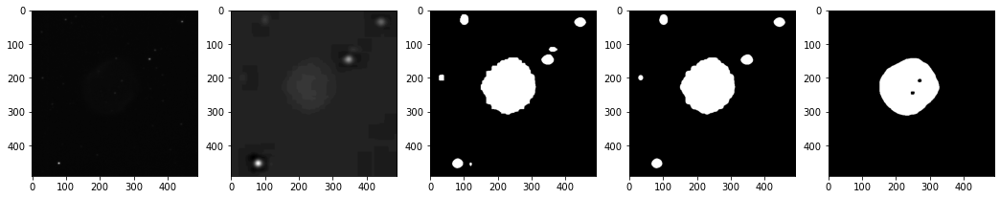

In [221]:
a = show_conv_autoencoder_output(dataset[3][0][0], conv_autoencoder, dataset[3][1][0][:,:,0], thresholds=[91, 93, 95])

['A18']
(490, 490, 1) (490, 490)


<Figure size 432x288 with 0 Axes>

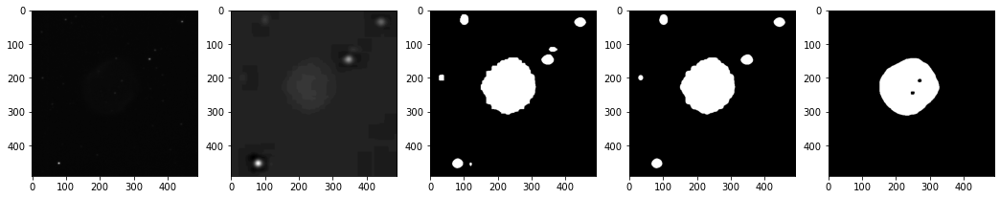

Jaccard: 0.7589	DICE: 0.8629	Precisión: 0.8493	Sensibilidad: 0.8770

['A3']
El umbral 4.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
No se ha segmentado la imagen
(490, 490, 1) (490, 490)


<Figure size 432x288 with 0 Axes>

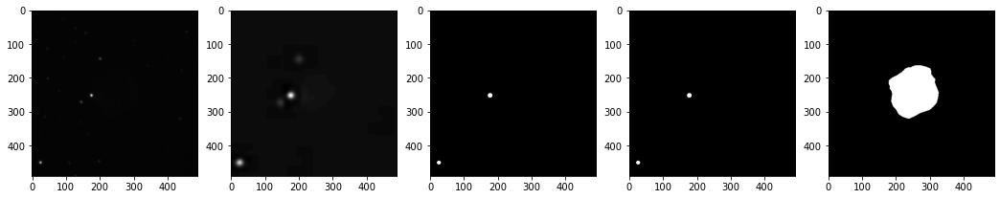

Jaccard: 0.0000	DICE: 0.0001	Precisión: 0.0000	Sensibilidad: 0.0000

['A46']
(490, 490, 1) (490, 490)


<Figure size 432x288 with 0 Axes>

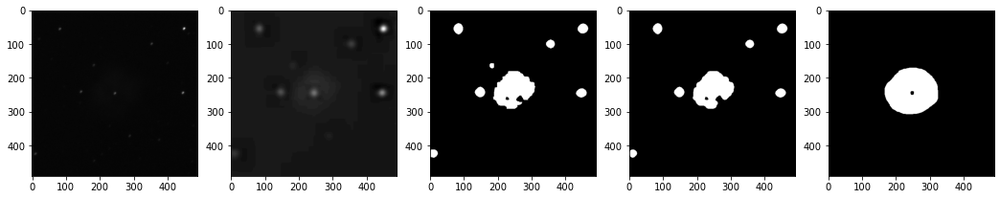

Jaccard: 0.4296	DICE: 0.6011	Precisión: 0.7028	Sensibilidad: 0.5250

['A57']
(492, 492, 1) (492, 492)


<Figure size 432x288 with 0 Axes>

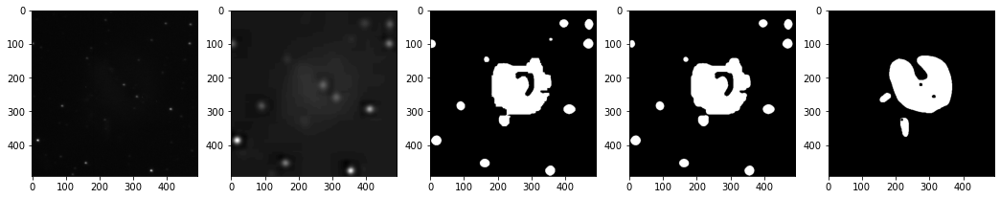

Jaccard: 0.5470	DICE: 0.7072	Precisión: 0.6819	Sensibilidad: 0.7344

['A68']
(246, 246, 1) (246, 246)


<Figure size 432x288 with 0 Axes>

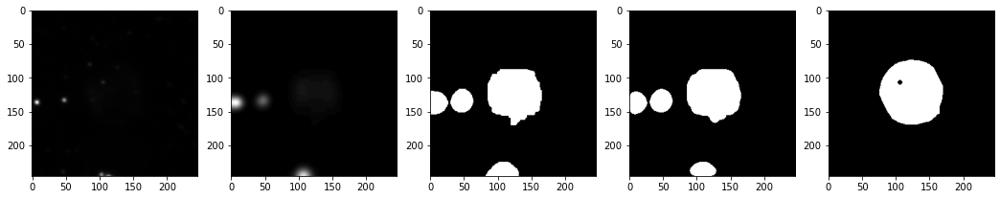

Jaccard: 0.5279	DICE: 0.6910	Precisión: 0.6820	Sensibilidad: 0.7002

['A70']
(246, 246, 1) (246, 246)


/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in true_divide


<Figure size 432x288 with 0 Axes>

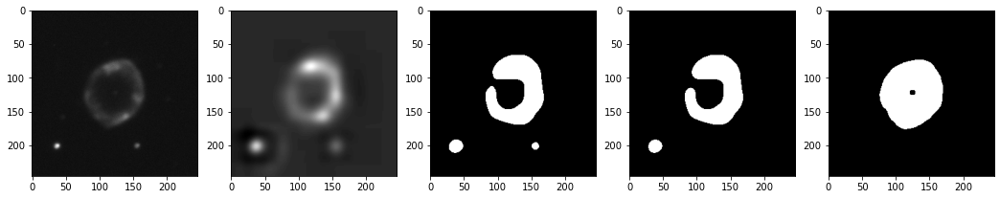

Jaccard: 0.5925	DICE: 0.7441	Precisión: 0.8516	Sensibilidad: 0.6607

['A71']


/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:99: RuntimeWarning: invalid value encountered in true_divide
/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in true_divide


(980, 980, 1) (980, 980)


<Figure size 432x288 with 0 Axes>

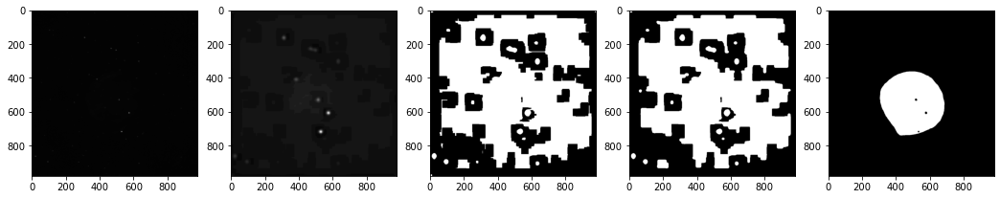

Jaccard: 0.1907	DICE: 0.3203	Precisión: 0.1943	Sensibilidad: 0.9101

['A73']
(490, 490, 1) (490, 490)


<Figure size 432x288 with 0 Axes>

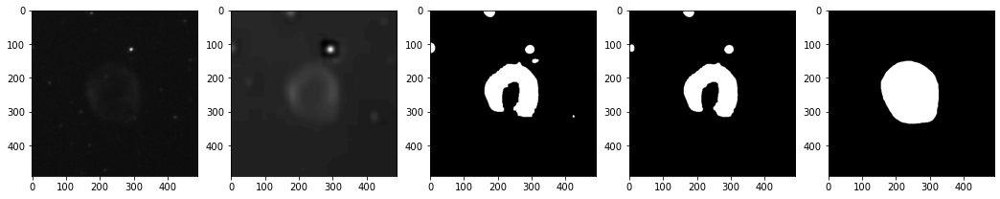

Jaccard: 0.5809	DICE: 0.7349	Precisión: 0.9171	Sensibilidad: 0.6131

['A86']
(246, 246, 1) (246, 246)


/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:99: RuntimeWarning: invalid value encountered in true_divide
/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:100: RuntimeWarning: invalid value encountered in true_divide
/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in true_divide


<Figure size 432x288 with 0 Axes>

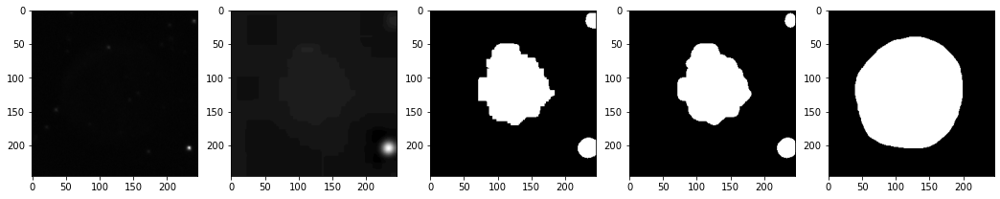

Jaccard: 0.4044	DICE: 0.5760	Precisión: 0.9022	Sensibilidad: 0.4230

['A8']
El umbral 2.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
(490, 490, 1) (490, 490)


<Figure size 432x288 with 0 Axes>

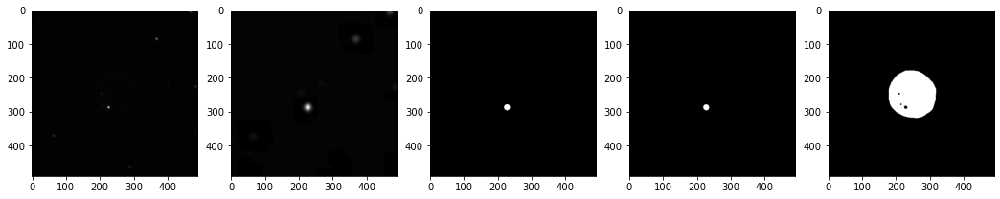

Jaccard: 0.0110	DICE: 0.0219	Precisión: 0.7066	Sensibilidad: 0.0111

['BV5_1']
El umbral 0.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
(490, 490, 1) (490, 490)


<Figure size 432x288 with 0 Axes>

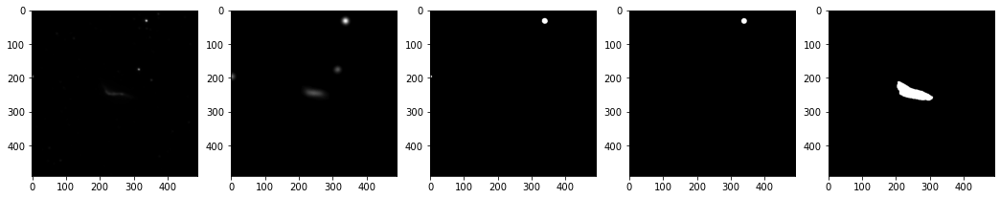

Jaccard: 0.0000	DICE: 0.0003	Precisión: 0.0000	Sensibilidad: 0.0000

['CRL618']
El umbral 3.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
(246, 246, 1) (246, 246)


/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in true_divide


<Figure size 432x288 with 0 Axes>

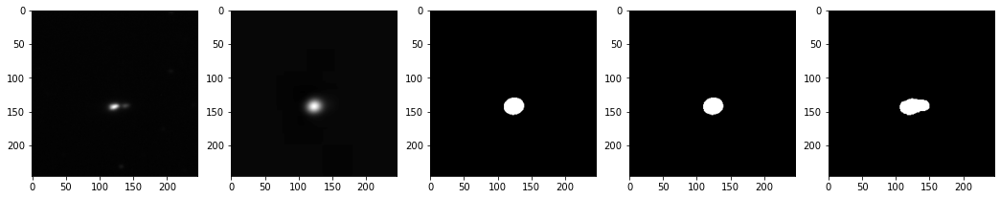

Jaccard: 0.6722	DICE: 0.8041	Precisión: 0.9340	Sensibilidad: 0.7057

['Dd1']
(123, 123, 1) (123, 123)


<Figure size 432x288 with 0 Axes>

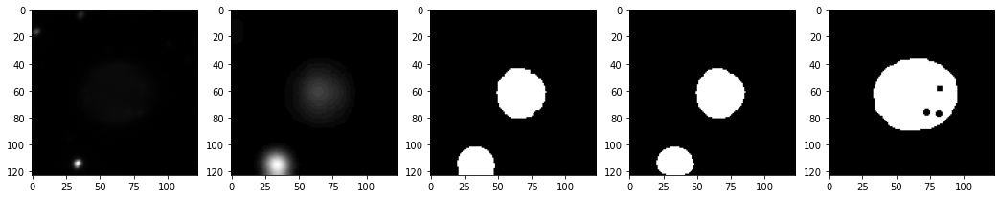

Jaccard: 0.3209	DICE: 0.4860	Precisión: 0.6622	Sensibilidad: 0.3837

['HaTr13']
El umbral 0.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
(246, 246, 1) (246, 246)


/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in true_divide


<Figure size 432x288 with 0 Axes>

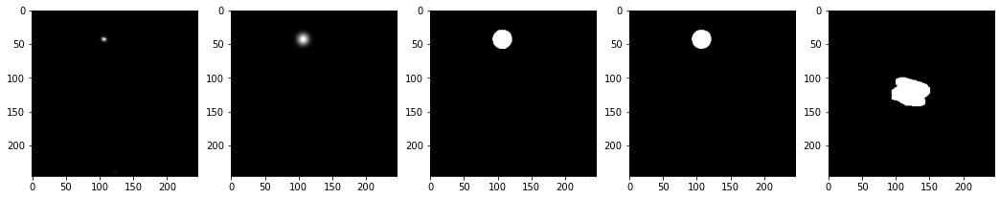

Jaccard: 0.0000	DICE: 0.0004	Precisión: 0.0000	Sensibilidad: 0.0000

['He1_1']
(246, 246, 1) (246, 246)


<Figure size 432x288 with 0 Axes>

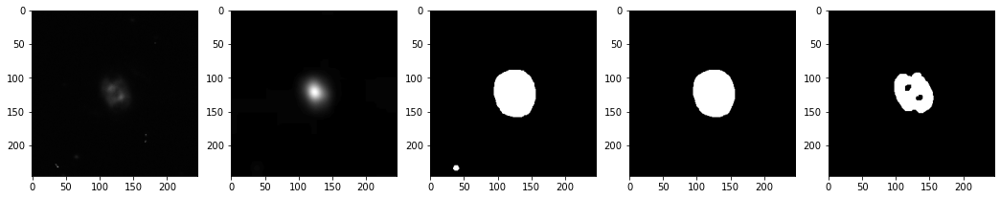

Jaccard: 0.7152	DICE: 0.8340	Precisión: 0.7154	Sensibilidad: 0.9996

['He2_429']
El umbral 0.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
(246, 246, 1) (246, 246)


/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in true_divide


<Figure size 432x288 with 0 Axes>

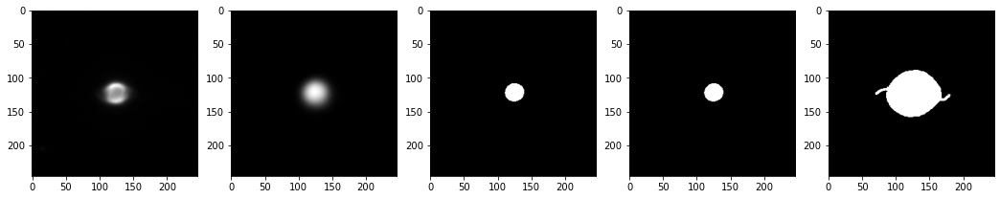

Jaccard: 0.1347	DICE: 0.2376	Precisión: 1.0000	Sensibilidad: 0.1347

['He2_430']
El umbral 0.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
No se ha segmentado la imagen
(123, 123, 1) (123, 123)


/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in true_divide


<Figure size 432x288 with 0 Axes>

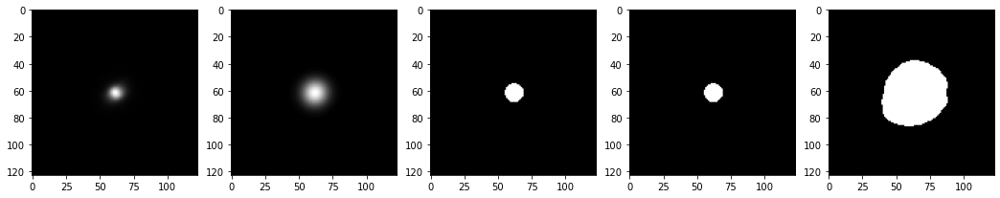

Jaccard: 0.0811	DICE: 0.1504	Precisión: 1.0000	Sensibilidad: 0.0811

['He2_447']
El umbral 0.0 no ha segmentado la imagen.
Probamos combinaciones excesivamente altas
(246, 246, 1) (246, 246)


/mnt/netapp1/Optcesga_FT2_RHEL7/2020/gentoo/22072020/usr/lib/python3.7/site-packages/ipykernel_launcher.py:102: RuntimeWarning: invalid value encountered in true_divide


<Figure size 432x288 with 0 Axes>

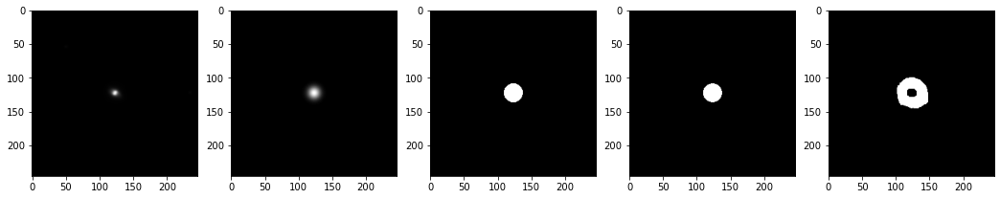

Jaccard: 0.2727	DICE: 0.4288	Precisión: 0.7549	Sensibilidad: 0.2992

Jaccard: 0.3467
DICE: 0.4556
Accuracy: 0.9159353959896942
Precisión: 0.6419
Sensibilidad: 0.4477



In [222]:
test_index = [i for i in list(range(len(dataset))) if i not in train_index]
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}
for im_index in test_index:
    im, mask, name = dataset[im_index]
    print(name)
    im_segm = show_conv_autoencoder_output(im[0], conv_autoencoder, mask[0][:,:,0], thresholds=[91, 93, 95])
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = True)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)

print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")

# Pruebas de segmentación con el Catálogo Morfológico de Nebulosas Planetarias del IAC (MÉTODO NO SUPERVISADO con CLASIFICADOR SUPERVISADO)

A partir de este punto, vamos a probar los método no supervisados que hemos probado anteriormente pero en vez de intentando definir ciertas reglas manualmente con las que se consiga una mácara binaria mas cercana al ground-truth, vamos a emplear un clasificador supervisado sencillo para que aplique las reglas por nosotros.

### 2.0. Particionamos los datos en entrenamiento y test

### 2.1. K-Means


Las pruebas con el K-Means van a ser realizadas con un modelo K-Means para cada imagen (para ambos canales) normalizando los datos entre 0 y 1 y dejandolos con sus valores reales.

In [25]:
from sklearn.cluster import KMeans
import cv2
import itertools

def generate_segmentations(im_segm, indices_grupos, plot=False, rango=(-1, 2)):
    indice_nuevo = max(indices_grupos) + 1
    for indice_original in indices_grupos:
        im_segm[im_segm == indice_original] = indice_nuevo
        indice_nuevo += 1 
    
    median = np.median(indices_grupos+max(indices_grupos)).astype(int)
    
    # Generar las imágenes segmentadas
    segmentaciones = []
    for i in range(rango[0], rango[1]):
        im_segm_binaria = (im_segm == median + i).astype(int)
        segmentaciones.append(im_segm_binaria)
        
    # Generar todas las combinaciones de las imágenes segmentadas
    combinaciones = []
    for L in range(1, len(segmentaciones)+1):
        for subset in itertools.combinations(segmentaciones, L):
            combinacion = sum(subset)
            combinaciones.append(combinacion)
    
    # Si plot es True, mostrar todas las combinaciones
    if plot:
        for i, combinacion in enumerate(combinaciones):
            plt.figure()
            plt.imshow(combinacion[:,:,0], cmap='gray')
            plt.title(f'Combinación {i+1}')
        plt.show()
    
    return combinaciones

def calcular_atributos(imagen):
    # Convertir la imagen a escala de grises de 8 bits
    imagen = imagen.astype(np.uint8)
    
    # Encontrar los componentes conectados en la imagen
    num_etiquetas, etiquetas = cv2.connectedComponents(imagen)

    # Contar el número de píxeles en cada componente
    num_pixeles_por_componente = np.bincount(etiquetas.flatten())
    
    num_componentes_pequenos = np.sum(num_pixeles_por_componente < 0.05 * imagen.shape[0] * imagen.shape[1])
    
    # Encontrar los contornos del objeto
    contornos, _ = cv2.findContours(imagen, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Para cada objeto en la imagen, calcular el área y el perímetro
    compactaciones = []
    areas = []
    for contorno in contornos:
        area = cv2.contourArea(contorno)
        perimetro = cv2.arcLength(contorno, True)
        
        # Evitar la división por cero
        if area == 0:
            continue
        
        # Calcular la compactación como (perímetro al cuadrado) / área
        compactacion = (perimetro**2) / area 
        compactaciones.append(compactacion)
        areas.append(area)
        
    # Comprobar si compactaciones y areas están vacías antes de calcular la media y el máximo
    if compactaciones:
        media_compactaciones = np.mean(compactaciones)
    else:
        media_compactaciones = np.nan

    if areas:
        max_area = np.max(areas)
        sum_area = np.sum(areas)
    else:
        max_area = np.nan
        sum_area = np.nan

    # Devolver la compactación media de todos los objetos en la imagen
    return media_compactaciones, len(compactaciones), max_area, sum_area, num_componentes_pequenos

def apply_KMeans(im, **kwargs):
    """
    Aplica el algoritmo K-Means a una imagen para segmentarla.
    
    Parámetros:
    im (np.array): Imagen a segmentar.
    mask (np.array): Máscara de la imagen.
    name (str): Nombre de la imagen.
    plot (bool, opcional): Si es True, muestra la imagen segmentada y la máscara. Por defecto es False.
    **kwargs: Parámetros adicionales para el algoritmo K-Means.
    
    Devuelve:
    kmeans (KMeans): Modelo K-Means entrenado.
    im_segm_binaria (np.array): Imagen segmentada.
    """
    im_array = tf.reshape(im, (-1, 1))  # Redimensionar la imagen para el algoritmo K-Means
    
    kmeans = KMeans(**kwargs).fit(im_array)  # Entrenar el modelo K-Means
    
    # Obtener la imagen segmentada aplicando el algoritmo a cada píxel de la imagen
    im_segm_array = kmeans.predict(im_array)

    # Cambiar las dimensiones de los datos segmentados para que se correspondan con la imagen inicial
    im_segm = im_segm_array.reshape(im.shape[0], im.shape[1], 1)
    
    return kmeans, im_segm

def extract_clustering(im, **kwargs):
    """
    Extrae los grupos de píxeles de una imagen segmentada.
    
    Parámetros:
    im (np.array): Imagen a segmentar.
    mask (np.array): Máscara de la imagen.
    name (str): Nombre de la imagen.
    plot (bool, opcional): Si es True, muestra la imagen segmentada y la máscara. Por defecto es False.
    **kwargs: Parámetros adicionales para el algoritmo K-Means.
    
    Devuelve:
    kmeans (KMeans): Modelo K-Means entrenado.
    im_segm_binaria (np.array): Imagen segmentada.
    """
    
    x = (tf.convert_to_tensor(im) - np.min(im)) / (np.max(im) - np.min(im))
    
    kmeans, im_segm = apply_KMeans(x, **kwargs)
    
    array_segm = tf.reshape(im_segm, (-1, 1))
    
    return array_segm

def flat_mask(mask):
    y = tf.cast((tf.convert_to_tensor(mask) - np.min(mask)) / (np.max(mask) - np.min(mask)), dtype=tf.int8)
    return tf.reshape(y, (-1, 1))

In [26]:
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1, x_transform=extract_clustering, y_transform=flat_mask, x_transform_parameters={"n_clusters": 2, "max_iter": 10, "random_state": 42})

In [36]:
im, mask, name = dataset[0]
mask = tf.reshape(mask[0],(im2[0].shape[0], im2[0].shape[1]))

In [13]:
dataset2 = NebulaeDataset(data_directory, masks_directory, df, batch_size=1)
im2, mask2, name2 = dataset2[0]

#### Árboles de decisión

Jaccard: 0.2255
DICE: 0.3089
Accuracy: 0.7935941497317773
Precisión: 0.4406
Sensibilidad: 0.3988



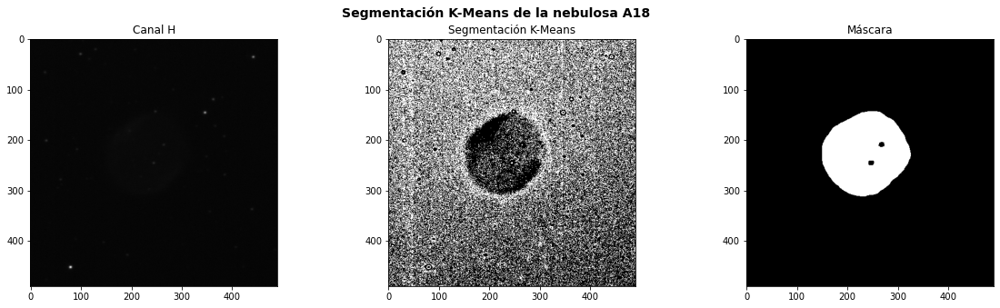

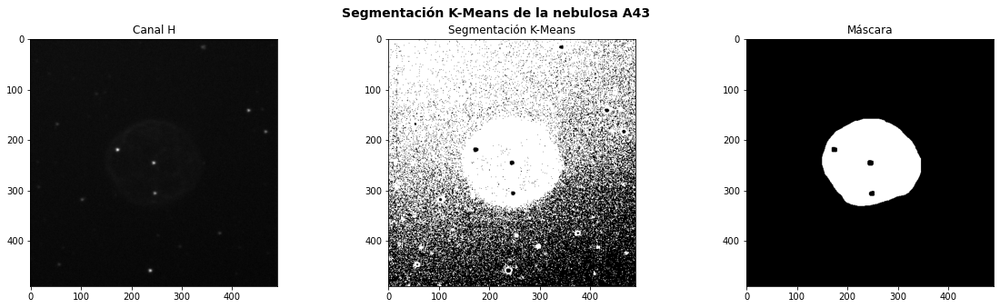

In [ ]:
# Prueba normalizando los datos entre 0 y 1
dataset = NebulaeDataset(data_directory, masks_directory, df, batch_size=1)  # Crea un conjunto de datos de nebulosas

# Inicializa un diccionario para almacenar los resultados de las métricas de evaluación
results = {"jaccard":[], "dice":[], "accuracy":[], "precision":[], "recall":[]}

plot = False  # Indica si se deben trazar las imágenes segmentadas
plot_pne_name = ["A18", "A43"]  # Nombres de las nebulosas a trazar

# Itera sobre el conjunto de datos
for im, mask, name in dataset:
    # Aplica el algoritmo K-Means a cada imagen
    kmeans, im_segm = apply_KMeans(im[0], n_clusters=2, max_iter=10, random_state=42)
    
    array_segm = im_segm.flatten().reshape(-1, 1)
    
    # Evalúa la segmentación y almacena los resultados
    jaccard, dice, accuracy, precision, recall, _ = evaluate_segmentation(mask[0], im_segm, confusion_matrix=False, verbose = False)
    results["jaccard"].append(jaccard)
    results["dice"].append(dice)
    results["accuracy"].append(accuracy)
    results["precision"].append(precision)
    results["recall"].append(recall)

    # Si el nombre de la nebulosa está en la lista de nombres a trazar y no se ha trazado ninguna imagen, traza la imagen segmentada y la máscara
    if name[0] in plot_pne_name and not plot:
        fig, ax = plt.subplots(1, 3, figsize=(20, 5))
        fig.suptitle(f"Segmentación K-Means de la nebulosa {name[0]}", fontweight = 'bold', fontsize = 14)
        ax[0].imshow(im[0][:,:,0], cmap = "gray")
        ax[0].set_title(f"Canal H")
        ax[1].imshow(im_segm[:,:,0], cmap = "gray")
        ax[1].set_title(f"Segmentación K-Means")
        ax[2].imshow(mask[0][:,:,0], cmap = "gray")
        ax[2].set_title(f"Máscara")

# Imprime las métricas de evaluación promedio
print(f"Jaccard: {np.mean(results['jaccard']):.4f}\nDICE: {np.mean(results['dice']):.4f}\nAccuracy: {np.mean(results['accuracy'])}\nPrecisión: {np.mean(results['precision']):.4f}\nSensibilidad: {np.mean(results['recall']):.4f}\n")
